# DL Practical 6: VAE, GAN, CGAN, DCGAN (EMNIST/FashionMNIST)

This notebook implements the full assignment in the same order as the PDF:
1. Variational Autoencoder (VAE)
2. Vanilla GAN
3. Conditional GAN (CGAN)
4. DCGAN
5. Comparative study
6. Data augmentation with synthetic samples
7. Loss-function and stability analysis

Framework: **PyTorch** (best fit for fast iteration and RTX 4050 GPU support).

In [1]:
import os
import math
import time
import random
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Subset, TensorDataset, random_split
from torchvision import datasets, transforms
from torchvision.utils import make_grid

from sklearn.manifold import TSNE
from sklearn.metrics import confusion_matrix, classification_report

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

def count_params(model: nn.Module) -> int:
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def show_images(images: torch.Tensor, title: str, nrow: int = 8, normalize: bool = True):
    images = images.detach().cpu()
    grid = make_grid(images, nrow=nrow, normalize=normalize, value_range=(-1, 1) if images.min() < 0 else (0, 1))
    plt.figure(figsize=(8, 8))
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)).squeeze(), cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.show()

Device: cuda
GPU: Tesla T4


In [2]:
@dataclass
class CFG:
    dataset_name: str = "fashion"  # "fashion" or "emnist"
    emnist_split: str = "balanced"
    data_root: str = "./data"
    batch_size: int = 128
    num_workers: int = 2
    epochs_quick: int = 20
    epochs_full: int = 20
    lr: float = 2e-4
    latent_dim: int = 32
    z_dim: int = 100
    img_size: int = 28

cfg = CFG()
cfg

CFG(dataset_name='fashion', emnist_split='balanced', data_root='./data', batch_size=128, num_workers=2, epochs_quick=20, epochs_full=20, lr=0.0002, latent_dim=32, z_dim=100, img_size=28)

In [3]:
transform_01 = transforms.Compose([transforms.ToTensor()])
transform_tanh = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

def get_dataset(dataset_name: str, split: str, train: bool, tanh: bool = False):
    t = transform_tanh if tanh else transform_01
    if dataset_name.lower() == "fashion":
        ds = datasets.FashionMNIST(root=cfg.data_root, train=train, download=True, transform=t)
        num_classes = 10
    elif dataset_name.lower() == "emnist":
        ds = datasets.EMNIST(root=cfg.data_root, split=split, train=train, download=True, transform=t)
        num_classes = len(ds.classes)
    else:
        raise ValueError("dataset_name must be 'fashion' or 'emnist'")
    return ds, num_classes

def get_loaders(dataset_name: str, split: str = "balanced", batch_size: int = 128, tanh: bool = False):
    train_ds, num_classes = get_dataset(dataset_name, split, train=True, tanh=tanh)
    test_ds, _ = get_dataset(dataset_name, split, train=False, tanh=tanh)

    val_size = int(0.1 * len(train_ds))
    train_size = len(train_ds) - val_size
    train_sub, val_sub = random_split(train_ds, [train_size, val_size], generator=torch.Generator().manual_seed(SEED))

    train_loader = DataLoader(train_sub, batch_size=batch_size, shuffle=True, num_workers=cfg.num_workers, pin_memory=True)
    val_loader = DataLoader(val_sub, batch_size=batch_size, shuffle=False, num_workers=cfg.num_workers, pin_memory=True)
    test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=cfg.num_workers, pin_memory=True)
    return train_loader, val_loader, test_loader, num_classes

train_loader_01, val_loader_01, test_loader_01, num_classes = get_loaders(cfg.dataset_name, cfg.emnist_split, cfg.batch_size, tanh=False)
train_loader_tanh, val_loader_tanh, test_loader_tanh, _ = get_loaders(cfg.dataset_name, cfg.emnist_split, cfg.batch_size, tanh=True)
print("num_classes:", num_classes)
x, y = next(iter(train_loader_01))
print("batch shape:", x.shape, y.shape)

100%|██████████| 26.4M/26.4M [00:01<00:00, 16.9MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 266kB/s]
100%|██████████| 4.42M/4.42M [00:00<00:00, 4.99MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 9.99MB/s]


num_classes: 10
batch shape: torch.Size([128, 1, 28, 28]) torch.Size([128])


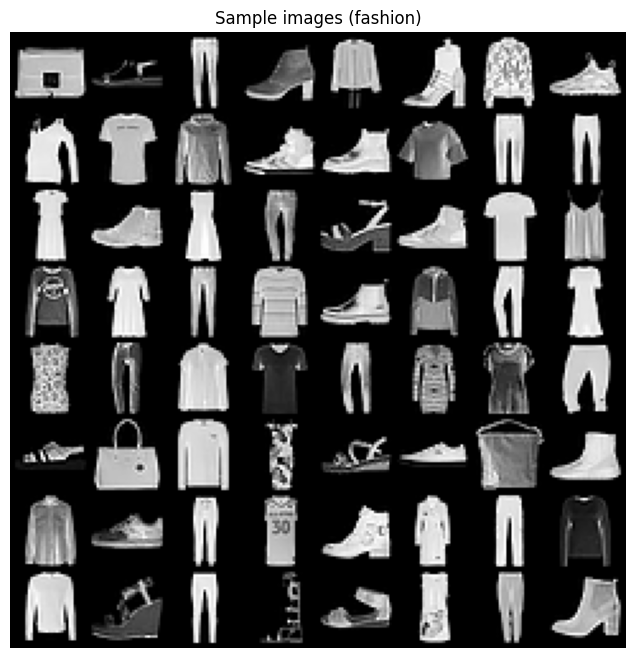

Sample labels: [8, 5, 1, 9, 4, 9, 4, 7, 2, 0, 4, 7, 9, 2, 1, 1]


In [4]:
x, y = next(iter(train_loader_01))
show_images(x[:64], f"Sample images ({cfg.dataset_name})", nrow=8, normalize=False)
print("Sample labels:", y[:16].tolist())

## Problem Statement 1: Variational Autoencoder (VAE)
- Encoder outputs mean and log-variance
- Reparameterization trick
- Decoder reconstructs image
- KL annealing in first 10 epochs
- Latent traversal, random sampling, latent study

In [5]:
class VAE(nn.Module):
    def __init__(self, latent_dim: int = 32):
        super().__init__()
        self.enc = nn.Sequential(
            nn.Conv2d(1, 32, 4, 2, 1),  # 14x14
            nn.ReLU(),
            nn.Conv2d(32, 64, 4, 2, 1),  # 7x7
            nn.ReLU(),
        )
        self.fc_mu = nn.Linear(64 * 7 * 7, latent_dim)
        self.fc_logvar = nn.Linear(64 * 7 * 7, latent_dim)

        self.fc_dec = nn.Linear(latent_dim, 64 * 7 * 7)
        self.dec = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 4, 2, 1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, 4, 2, 1),
            nn.Sigmoid(),
        )

    def encode(self, x):
        h = self.enc(x).flatten(1)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h = self.fc_dec(z).view(-1, 64, 7, 7)
        return self.dec(h)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        xhat = self.decode(z)
        return xhat, mu, logvar

def vae_loss(xhat, x, mu, logvar, kl_weight=1.0, use_mse=False):
    if use_mse:
        recon = F.mse_loss(xhat, x, reduction='sum') / x.size(0)
    else:
        recon = F.binary_cross_entropy(xhat, x, reduction='sum') / x.size(0)
    kl = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.size(0)
    return recon + kl_weight * kl, recon.item(), kl.item()

def train_vae(model, train_loader, val_loader, epochs=10, lr=2e-4, kl_warmup_epochs=10):
    model.to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    hist = {"train": [], "val": [], "recon": [], "kl": []}

    for epoch in range(1, epochs + 1):
        model.train()
        kl_w = min(1.0, epoch / max(1, kl_warmup_epochs))
        tr_loss, tr_recon, tr_kl = 0.0, 0.0, 0.0
        for xb, _ in train_loader:
            xb = xb.to(device, non_blocking=True)
            opt.zero_grad(set_to_none=True)
            xhat, mu, logvar = model(xb)
            loss, recon, kl = vae_loss(xhat, xb, mu, logvar, kl_weight=kl_w)
            loss.backward()
            opt.step()
            tr_loss += loss.item()
            tr_recon += recon
            tr_kl += kl

        model.eval()
        va_loss = 0.0
        with torch.no_grad():
            for xb, _ in val_loader:
                xb = xb.to(device, non_blocking=True)
                xhat, mu, logvar = model(xb)
                loss, _, _ = vae_loss(xhat, xb, mu, logvar, kl_weight=1.0)
                va_loss += loss.item()

        ntr = len(train_loader)
        nva = len(val_loader)
        hist["train"].append(tr_loss / ntr)
        hist["val"].append(va_loss / nva)
        hist["recon"].append(tr_recon / ntr)
        hist["kl"].append(tr_kl / ntr)
        print(f"[VAE] epoch {epoch:02d}/{epochs} | train={hist['train'][-1]:.4f} val={hist['val'][-1]:.4f} recon={hist['recon'][-1]:.4f} kl={hist['kl'][-1]:.4f} kl_w={kl_w:.2f}")

    return hist

def vae_reconstruct(model, loader, n=32):
    model.eval()
    xb, _ = next(iter(loader))
    xb = xb[:n].to(device)
    with torch.no_grad():
        xhat, _, _ = model(xb)
    return xb.cpu(), xhat.cpu()

def vae_sample(model, n=64, latent_dim=32):
    model.eval()
    with torch.no_grad():
        z = torch.randn(n, latent_dim, device=device)
        xg = model.decode(z)
    return xg.cpu()

def interpolate_latent(model, x1, x2, steps=10):
    model.eval()
    with torch.no_grad():
        mu1, _ = model.encode(x1.unsqueeze(0).to(device))
        mu2, _ = model.encode(x2.unsqueeze(0).to(device))
        alphas = torch.linspace(0, 1, steps, device=device).unsqueeze(1)
        z = mu1 * (1 - alphas) + mu2 * alphas
        out = model.decode(z)
    return out.cpu()


--- Training VAE with latent_dim=8 ---
[VAE] epoch 01/20 | train=311.2774 val=304.3562 recon=304.6988 kl=65.7851 kl_w=0.10
[VAE] epoch 02/20 | train=252.4777 val=272.9330 recon=245.5718 kl=34.5294 kl_w=0.20
[VAE] epoch 03/20 | train=247.6222 val=263.2493 recon=240.0727 kl=25.1651 kl_w=0.30
[VAE] epoch 04/20 | train=246.2483 val=258.5183 recon=237.5840 kl=21.6608 kl_w=0.40
[VAE] epoch 05/20 | train=245.9575 val=255.8451 recon=236.0957 kl=19.7234 kl_w=0.50
[VAE] epoch 06/20 | train=246.1707 val=253.8921 recon=235.1135 kl=18.4285 kl_w=0.60
[VAE] epoch 07/20 | train=246.6542 val=252.2698 recon=234.4461 kl=17.4401 kl_w=0.70
[VAE] epoch 08/20 | train=247.2792 val=251.2347 recon=233.9899 kl=16.6116 kl_w=0.80
[VAE] epoch 09/20 | train=247.9758 val=250.2301 recon=233.6728 kl=15.8922 kl_w=0.90
[VAE] epoch 10/20 | train=248.7521 val=249.5027 recon=233.4768 kl=15.2753 kl_w=1.00
[VAE] epoch 11/20 | train=248.0014 val=248.8722 recon=232.8798 kl=15.1216 kl_w=1.00
[VAE] epoch 12/20 | train=247.4244 v

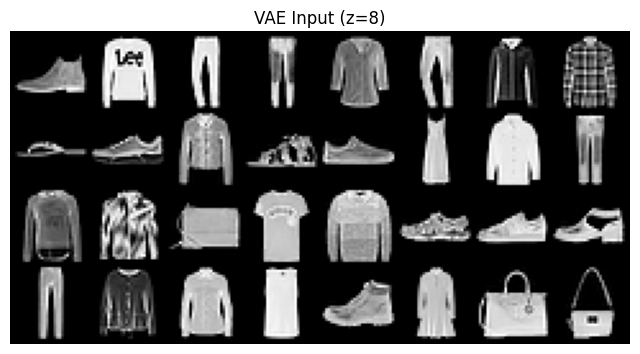

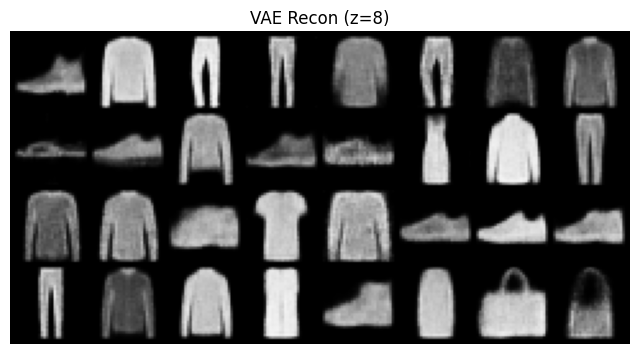

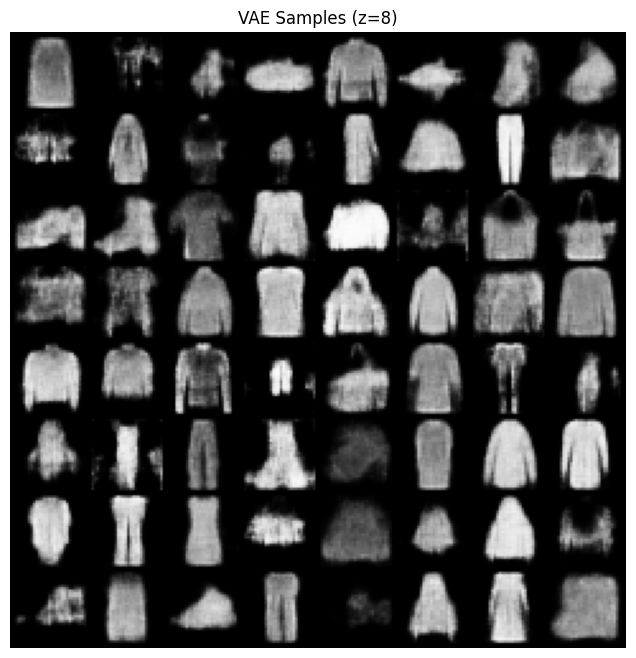

Training time: 1.86 min

--- Training VAE with latent_dim=32 ---
[VAE] epoch 01/20 | train=312.2104 val=320.5435 recon=301.7964 kl=104.1395 kl_w=0.10
[VAE] epoch 02/20 | train=249.9974 val=289.1462 recon=238.7179 kl=56.3976 kl_w=0.20
[VAE] epoch 03/20 | train=246.6013 val=277.5046 recon=232.7007 kl=46.3355 kl_w=0.30
[VAE] epoch 04/20 | train=246.3529 val=269.7951 recon=230.0934 kl=40.6488 kl_w=0.40
[VAE] epoch 05/20 | train=247.0148 val=264.0907 recon=228.8577 kl=36.3140 kl_w=0.50
[VAE] epoch 06/20 | train=247.9110 val=261.0541 recon=228.4004 kl=32.5177 kl_w=0.60
[VAE] epoch 07/20 | train=248.9469 val=257.7048 recon=228.4490 kl=29.2826 kl_w=0.70
[VAE] epoch 08/20 | train=249.9563 val=255.1851 recon=228.8079 kl=26.4355 kl_w=0.80
[VAE] epoch 09/20 | train=250.9435 val=253.4268 recon=229.2631 kl=24.0894 kl_w=0.90
[VAE] epoch 10/20 | train=251.8333 val=252.2018 recon=229.7896 kl=22.0437 kl_w=1.00
[VAE] epoch 11/20 | train=250.6927 val=251.0554 recon=229.3790 kl=21.3137 kl_w=1.00
[VAE] epoc

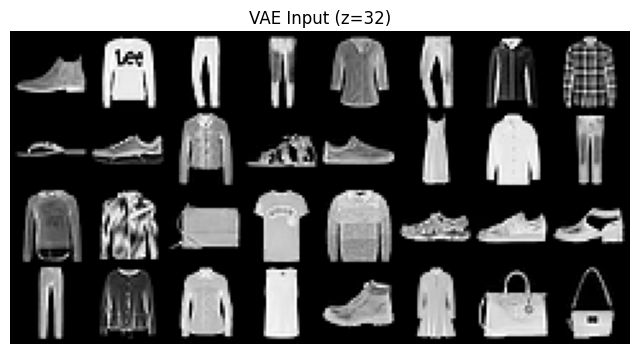

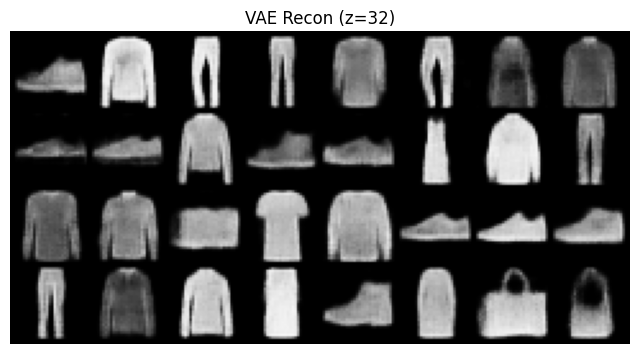

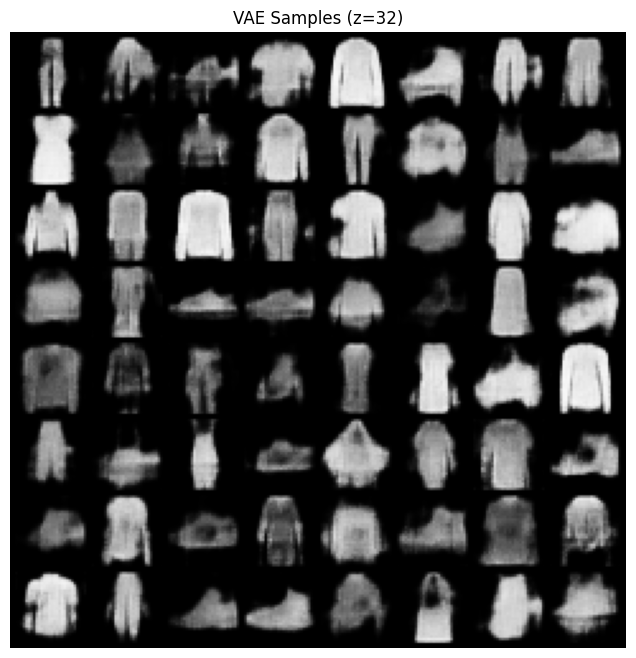

Training time: 1.83 min

--- Training VAE with latent_dim=128 ---
[VAE] epoch 01/20 | train=285.8609 val=335.0911 recon=275.4694 kl=103.9152 kl_w=0.10
[VAE] epoch 02/20 | train=250.4278 val=301.7903 recon=236.7385 kl=68.4464 kl_w=0.20
[VAE] epoch 03/20 | train=248.3852 val=282.3385 recon=232.4906 kl=52.9820 kl_w=0.30
[VAE] epoch 04/20 | train=246.9531 val=269.9604 recon=230.0378 kl=42.2882 kl_w=0.40
[VAE] epoch 05/20 | train=246.4679 val=262.4089 recon=228.6945 kl=35.5468 kl_w=0.50
[VAE] epoch 06/20 | train=246.8760 val=258.9606 recon=228.2128 kl=31.1054 kl_w=0.60
[VAE] epoch 07/20 | train=247.7403 val=255.9641 recon=228.2070 kl=27.9048 kl_w=0.70
[VAE] epoch 08/20 | train=248.7803 val=254.0638 recon=228.5001 kl=25.3503 kl_w=0.80
[VAE] epoch 09/20 | train=249.9427 val=252.6625 recon=229.0089 kl=23.2597 kl_w=0.90
[VAE] epoch 10/20 | train=251.0752 val=251.5009 recon=229.5497 kl=21.5256 kl_w=1.00
[VAE] epoch 11/20 | train=250.1449 val=250.8141 recon=229.1409 kl=21.0041 kl_w=1.00
[VAE] epo

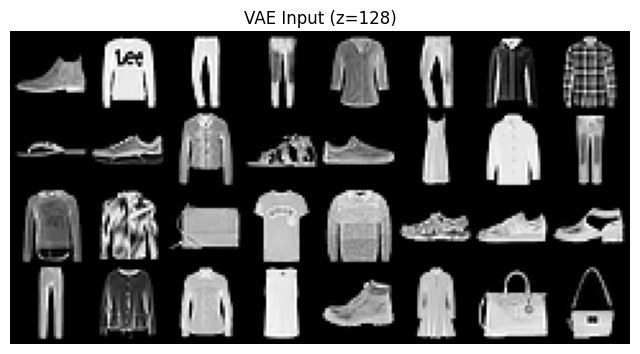

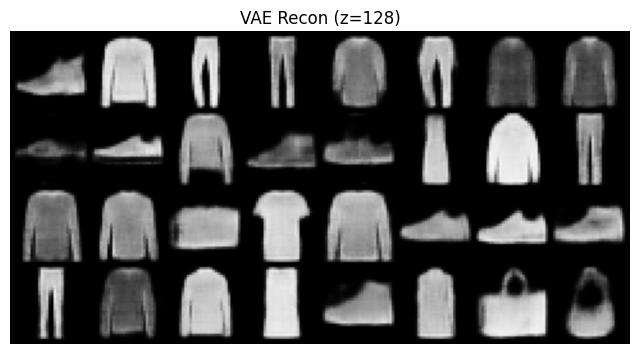

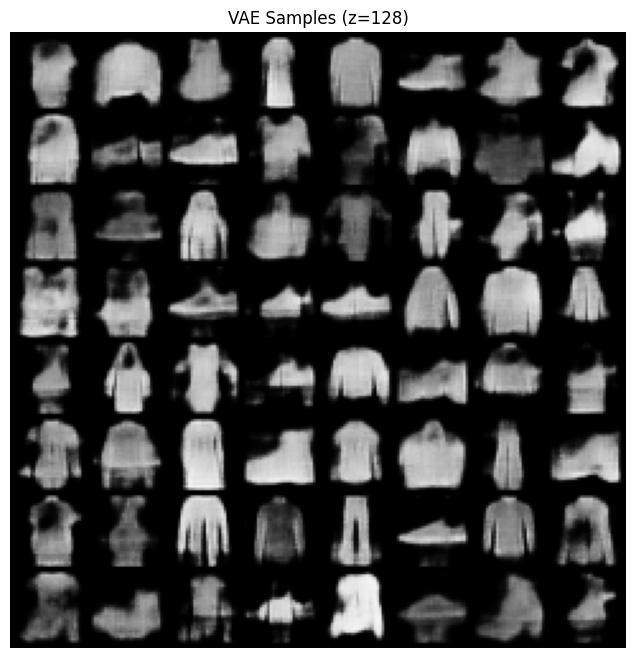

Training time: 1.84 min
Best latent dim by val loss: 8


In [6]:
latent_dims = [8, 32, 128]
vae_runs = {}

for ld in latent_dims:
    print(f"\n--- Training VAE with latent_dim={ld} ---")
    vae = VAE(latent_dim=ld).to(device)
    start = time.time()
    hist = train_vae(vae, train_loader_01, val_loader_01, epochs=cfg.epochs_full, lr=cfg.lr, kl_warmup_epochs=10)
    elapsed = (time.time() - start) / 60.0

    xb, xh = vae_reconstruct(vae, test_loader_01, n=32)
    show_images(xb, f"VAE Input (z={ld})", nrow=8, normalize=False)
    show_images(xh, f"VAE Recon (z={ld})", nrow=8, normalize=False)

    samples = vae_sample(vae, n=64, latent_dim=ld)
    show_images(samples, f"VAE Samples (z={ld})", nrow=8, normalize=False)

    vae_runs[ld] = {
        "model": vae,
        "hist": hist,
        "minutes": elapsed,
        "final_val": hist['val'][-1],
    }

    print(f"Training time: {elapsed:.2f} min")

best_ld = min(vae_runs, key=lambda k: vae_runs[k]['final_val'])
vae_best = vae_runs[best_ld]['model']
print("Best latent dim by val loss:", best_ld)

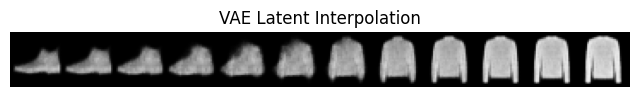

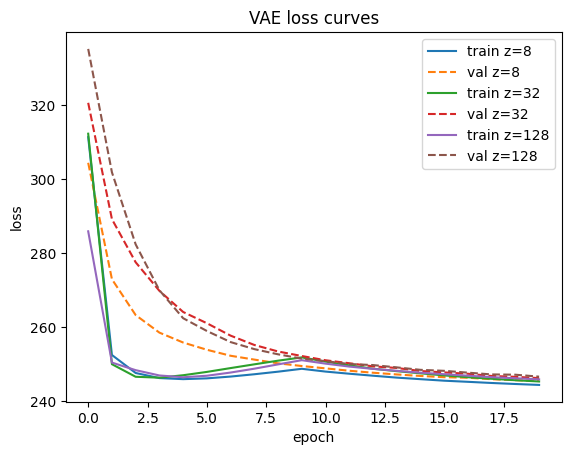

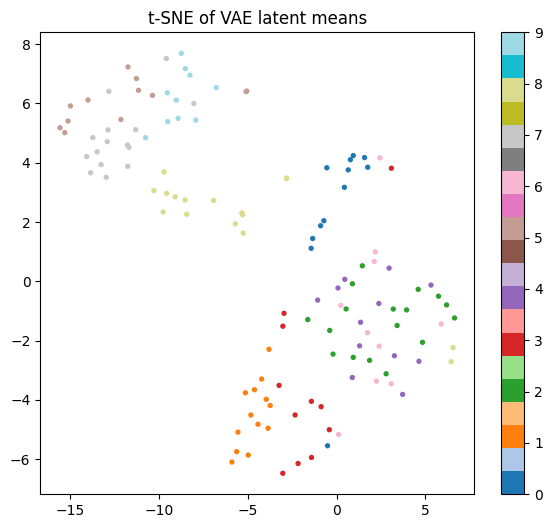

In [7]:
xb, yb = next(iter(test_loader_01))
interp = interpolate_latent(vae_best, xb[0], xb[1], steps=12)
show_images(interp, "VAE Latent Interpolation", nrow=12, normalize=False)

for ld in latent_dims:
    h = vae_runs[ld]['hist']
    plt.plot(h['train'], label=f"train z={ld}")
    plt.plot(h['val'], linestyle='--', label=f"val z={ld}")
plt.title("VAE loss curves")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.legend()
plt.show()

# t-SNE of latent means for one minibatch
vae_best.eval()
xb, yb = next(iter(test_loader_01))
with torch.no_grad():
    mu, _ = vae_best.encode(xb.to(device))
z2 = TSNE(n_components=2, random_state=SEED, perplexity=30).fit_transform(mu.cpu().numpy())
plt.figure(figsize=(7, 6))
plt.scatter(z2[:, 0], z2[:, 1], c=yb.numpy(), s=8, cmap='tab20')
plt.title("t-SNE of VAE latent means")
plt.colorbar()
plt.show()

## Problem Statement 2: Vanilla GAN
- Fully-connected Generator and Discriminator
- Label smoothing (0.9 for real)
- One D step + one G step
- Noise-dimension experiment and instability analysis

In [8]:
class FCGenerator(nn.Module):
    def __init__(self, z_dim=100):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 784), nn.Tanh(),
        )

    def forward(self, z):
        return self.net(z).view(-1, 1, 28, 28)

class FCDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(784, 512), nn.LeakyReLU(0.2, inplace=True), nn.Dropout(0.3),
            nn.Linear(512, 256), nn.LeakyReLU(0.2, inplace=True), nn.Dropout(0.3),
            nn.Linear(256, 1), nn.Sigmoid(),
        )

    def forward(self, x):
        return self.net(x.view(x.size(0), -1))

def train_vanilla_gan(train_loader, z_dim=100, epochs=5, lr=2e-4):
    G = FCGenerator(z_dim).to(device)
    D = FCDiscriminator().to(device)

    opt_g = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_d = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    bce = nn.BCELoss()

    hist = {"g": [], "d": [], "d_acc": []}

    for epoch in range(1, epochs + 1):
        g_running, d_running, acc_running = 0.0, 0.0, 0.0
        for xb, _ in train_loader:
            xb = xb.to(device, non_blocking=True)
            bs = xb.size(0)

            real = torch.full((bs, 1), 0.9, device=device)
            fake = torch.zeros((bs, 1), device=device)

            # D step
            opt_d.zero_grad(set_to_none=True)
            z = torch.randn(bs, z_dim, device=device)
            x_fake = G(z).detach()
            p_real = D(xb)
            p_fake = D(x_fake)
            d_loss = bce(p_real, real) + bce(p_fake, fake)
            d_loss.backward()
            opt_d.step()

            pred_real = (p_real > 0.5).float()
            pred_fake = (p_fake <= 0.5).float()
            d_acc = 0.5 * (pred_real.mean() + pred_fake.mean())

            # G step (non-saturating)
            opt_g.zero_grad(set_to_none=True)
            z = torch.randn(bs, z_dim, device=device)
            x_fake = G(z)
            p = D(x_fake)
            g_loss = bce(p, torch.ones_like(p))
            g_loss.backward()
            opt_g.step()

            g_running += g_loss.item()
            d_running += d_loss.item()
            acc_running += d_acc.item()

        n = len(train_loader)
        hist['g'].append(g_running / n)
        hist['d'].append(d_running / n)
        hist['d_acc'].append(acc_running / n)

        with torch.no_grad():
            z = torch.randn(64, z_dim, device=device)
            samples = G(z).cpu()
        print(f"[GAN] epoch {epoch:02d}/{epochs} | G={hist['g'][-1]:.4f} D={hist['d'][-1]:.4f} D_acc={hist['d_acc'][-1]:.3f}")
        if epoch % 5 == 0 or epoch == epochs:
            show_images(samples, f"Vanilla GAN samples epoch {epoch}", nrow=8, normalize=True)

    return G, D, hist


--- Training Vanilla GAN with z_dim=50 ---
[GAN] epoch 01/20 | G=1.4055 D=0.9979 D_acc=0.847
[GAN] epoch 02/20 | G=1.8750 D=1.0176 D_acc=0.800
[GAN] epoch 03/20 | G=1.6662 D=1.0817 D_acc=0.762
[GAN] epoch 04/20 | G=1.3852 D=1.1543 D_acc=0.719
[GAN] epoch 05/20 | G=1.2973 D=1.1841 D_acc=0.701


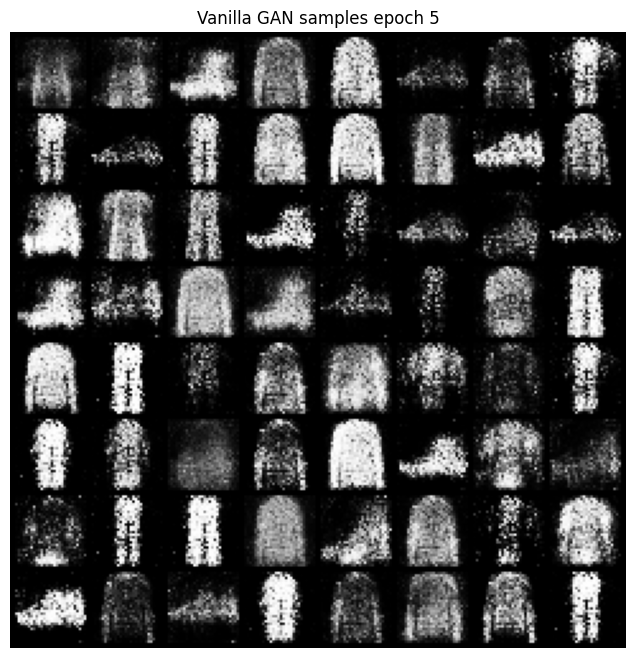

[GAN] epoch 06/20 | G=1.2689 D=1.1844 D_acc=0.700
[GAN] epoch 07/20 | G=1.2237 D=1.2090 D_acc=0.684
[GAN] epoch 08/20 | G=1.1561 D=1.2449 D_acc=0.664
[GAN] epoch 09/20 | G=1.1110 D=1.2578 D_acc=0.652
[GAN] epoch 10/20 | G=1.0776 D=1.2710 D_acc=0.644


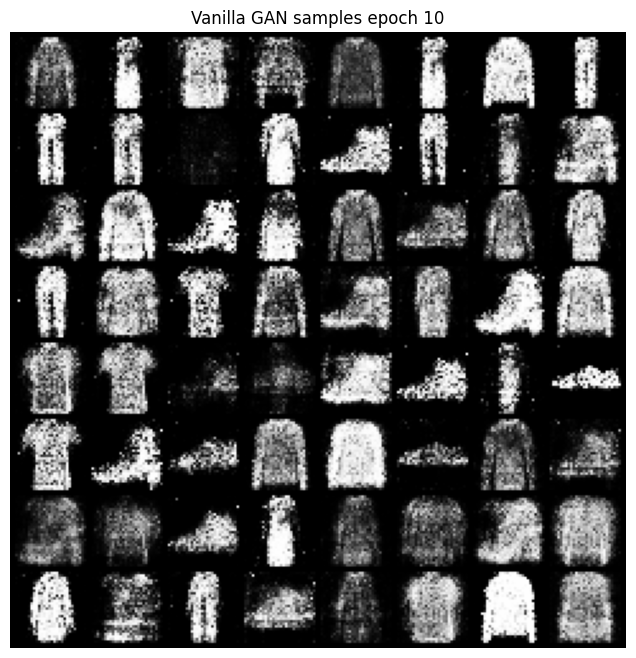

[GAN] epoch 11/20 | G=1.0486 D=1.2816 D_acc=0.635
[GAN] epoch 12/20 | G=1.0144 D=1.2964 D_acc=0.622
[GAN] epoch 13/20 | G=0.9802 D=1.3115 D_acc=0.609
[GAN] epoch 14/20 | G=0.9671 D=1.3159 D_acc=0.603
[GAN] epoch 15/20 | G=0.9601 D=1.3234 D_acc=0.596


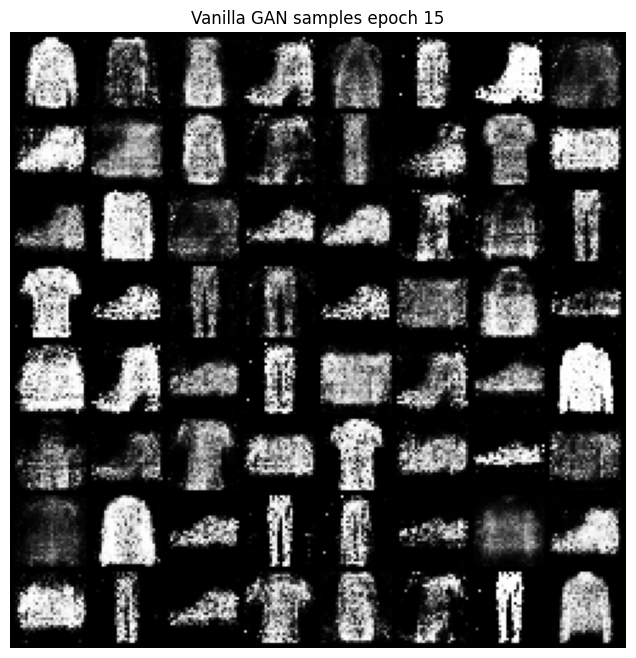

[GAN] epoch 16/20 | G=0.9519 D=1.3229 D_acc=0.597
[GAN] epoch 17/20 | G=0.9401 D=1.3277 D_acc=0.591
[GAN] epoch 18/20 | G=0.9380 D=1.3280 D_acc=0.590
[GAN] epoch 19/20 | G=0.9387 D=1.3318 D_acc=0.587
[GAN] epoch 20/20 | G=0.9317 D=1.3313 D_acc=0.589


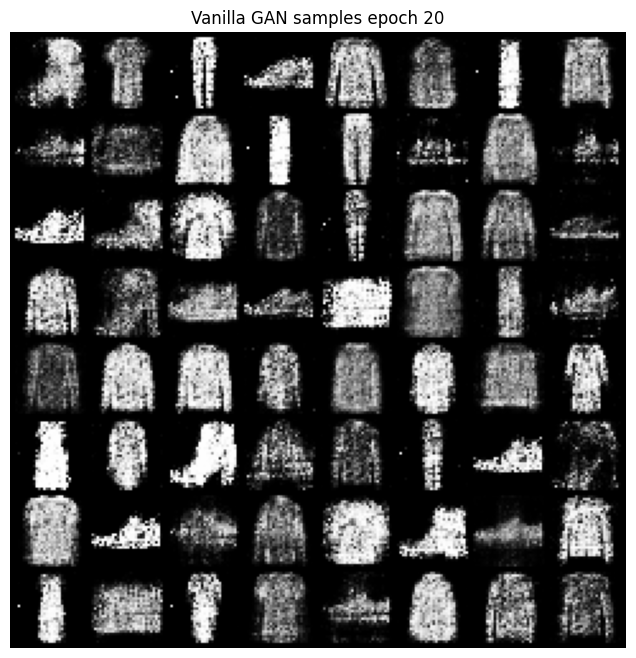

time=2.69 min | diversity_proxy=0.5119

--- Training Vanilla GAN with z_dim=100 ---
[GAN] epoch 01/20 | G=1.3729 D=1.0076 D_acc=0.844
[GAN] epoch 02/20 | G=1.9085 D=1.0143 D_acc=0.803
[GAN] epoch 03/20 | G=1.7367 D=1.0621 D_acc=0.774
[GAN] epoch 04/20 | G=1.4466 D=1.1488 D_acc=0.722
[GAN] epoch 05/20 | G=1.3491 D=1.1697 D_acc=0.710


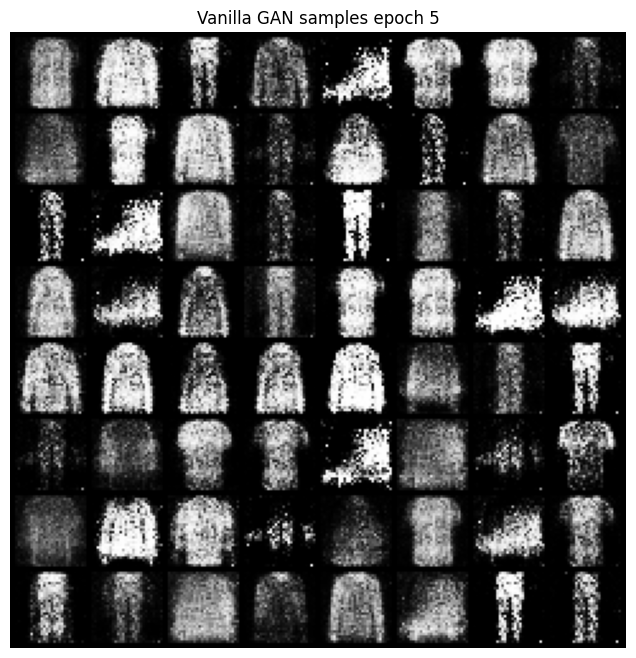

[GAN] epoch 06/20 | G=1.2156 D=1.2141 D_acc=0.679
[GAN] epoch 07/20 | G=1.1764 D=1.2325 D_acc=0.671
[GAN] epoch 08/20 | G=1.1358 D=1.2536 D_acc=0.655
[GAN] epoch 09/20 | G=1.1085 D=1.2618 D_acc=0.650
[GAN] epoch 10/20 | G=1.1024 D=1.2607 D_acc=0.650


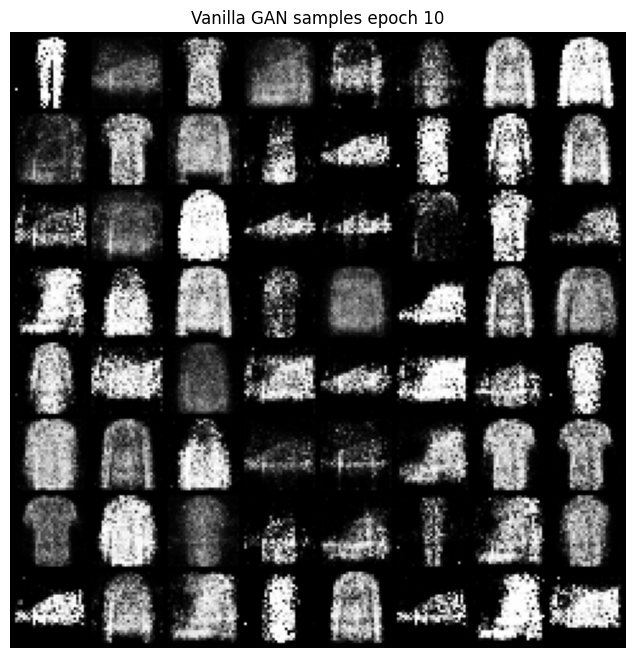

[GAN] epoch 11/20 | G=1.0712 D=1.2737 D_acc=0.641
[GAN] epoch 12/20 | G=1.0586 D=1.2789 D_acc=0.636
[GAN] epoch 13/20 | G=1.0361 D=1.2889 D_acc=0.627
[GAN] epoch 14/20 | G=0.9900 D=1.3055 D_acc=0.612
[GAN] epoch 15/20 | G=0.9945 D=1.3044 D_acc=0.612


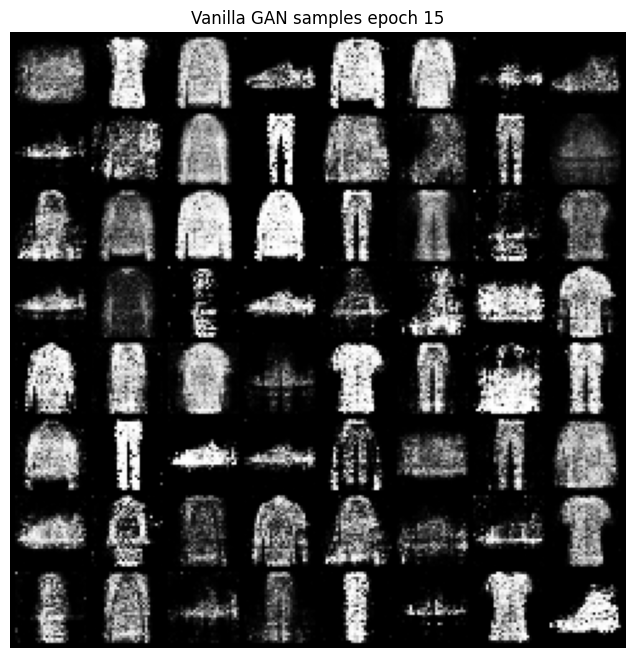

[GAN] epoch 16/20 | G=0.9586 D=1.3201 D_acc=0.602
[GAN] epoch 17/20 | G=0.9682 D=1.3163 D_acc=0.604
[GAN] epoch 18/20 | G=0.9558 D=1.3232 D_acc=0.598
[GAN] epoch 19/20 | G=0.9525 D=1.3236 D_acc=0.595
[GAN] epoch 20/20 | G=0.9442 D=1.3231 D_acc=0.597


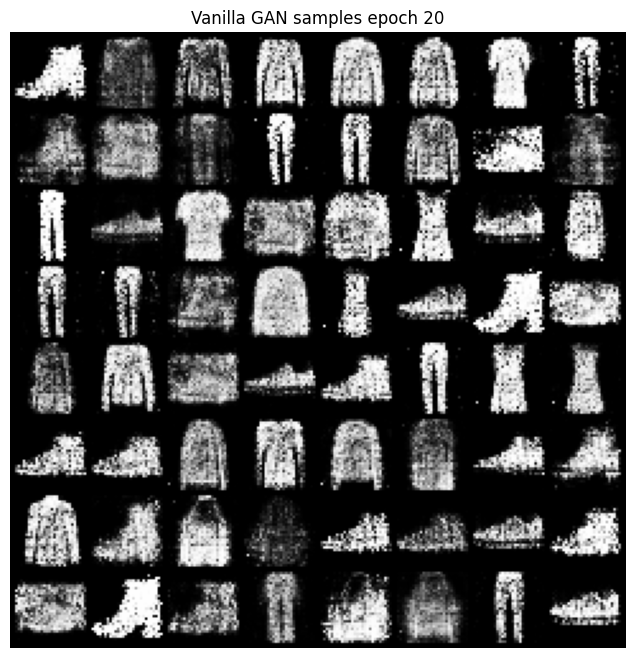

time=2.62 min | diversity_proxy=0.5588

--- Training Vanilla GAN with z_dim=200 ---
[GAN] epoch 01/20 | G=1.4751 D=0.9720 D_acc=0.862
[GAN] epoch 02/20 | G=2.0409 D=0.9479 D_acc=0.828
[GAN] epoch 03/20 | G=1.7849 D=1.0563 D_acc=0.774
[GAN] epoch 04/20 | G=1.5705 D=1.1110 D_acc=0.743
[GAN] epoch 05/20 | G=1.4701 D=1.1263 D_acc=0.735


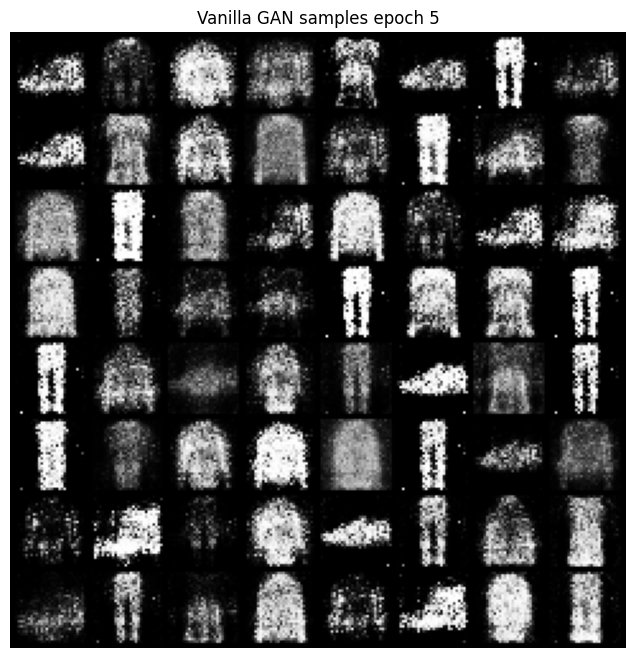

[GAN] epoch 06/20 | G=1.2564 D=1.2023 D_acc=0.690
[GAN] epoch 07/20 | G=1.2161 D=1.2217 D_acc=0.681
[GAN] epoch 08/20 | G=1.1938 D=1.2303 D_acc=0.674
[GAN] epoch 09/20 | G=1.1766 D=1.2308 D_acc=0.673
[GAN] epoch 10/20 | G=1.1283 D=1.2541 D_acc=0.656


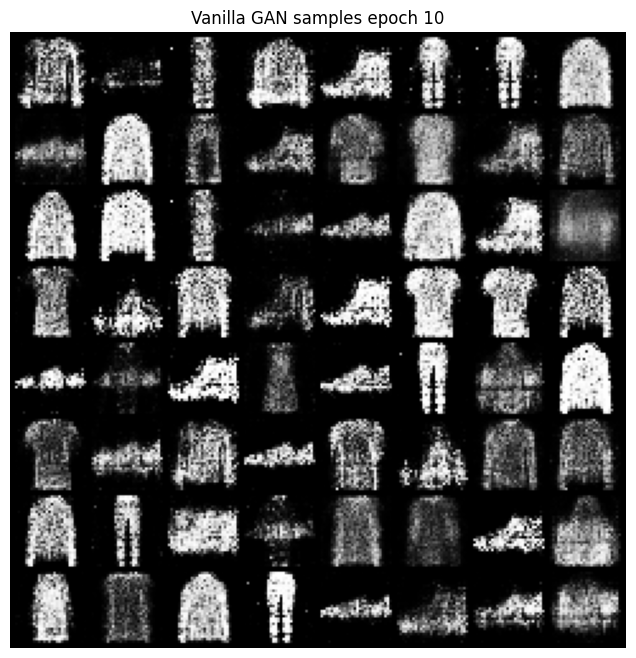

[GAN] epoch 11/20 | G=1.0607 D=1.2722 D_acc=0.641
[GAN] epoch 12/20 | G=1.0315 D=1.2869 D_acc=0.631
[GAN] epoch 13/20 | G=1.0119 D=1.2928 D_acc=0.624
[GAN] epoch 14/20 | G=1.0008 D=1.3011 D_acc=0.616
[GAN] epoch 15/20 | G=0.9866 D=1.3089 D_acc=0.611


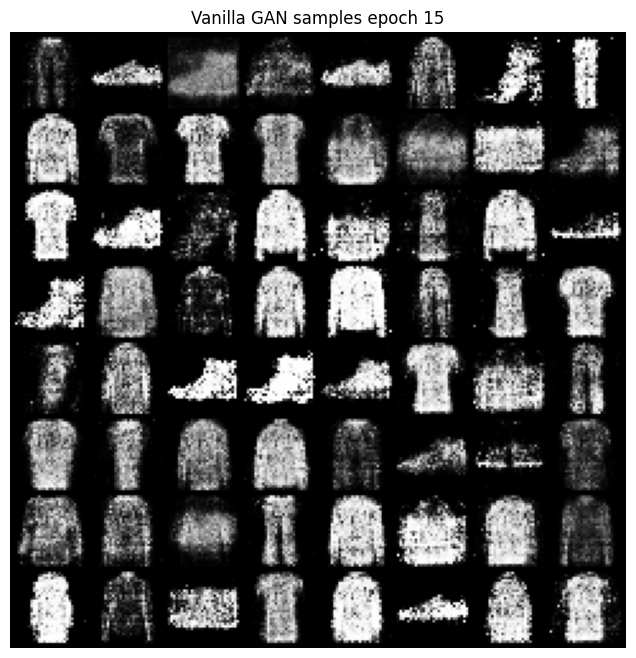

[GAN] epoch 16/20 | G=0.9839 D=1.3091 D_acc=0.610
[GAN] epoch 17/20 | G=0.9700 D=1.3133 D_acc=0.606
[GAN] epoch 18/20 | G=0.9610 D=1.3165 D_acc=0.605
[GAN] epoch 19/20 | G=0.9673 D=1.3189 D_acc=0.601
[GAN] epoch 20/20 | G=0.9477 D=1.3240 D_acc=0.597


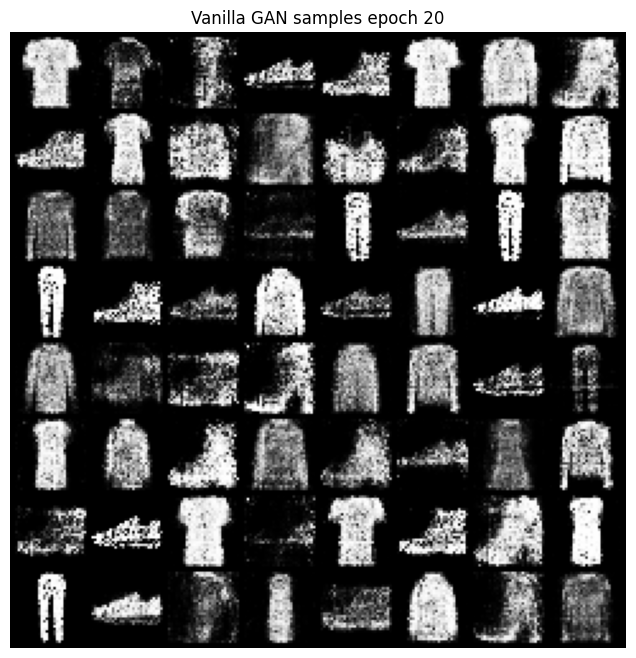

time=2.61 min | diversity_proxy=0.5626


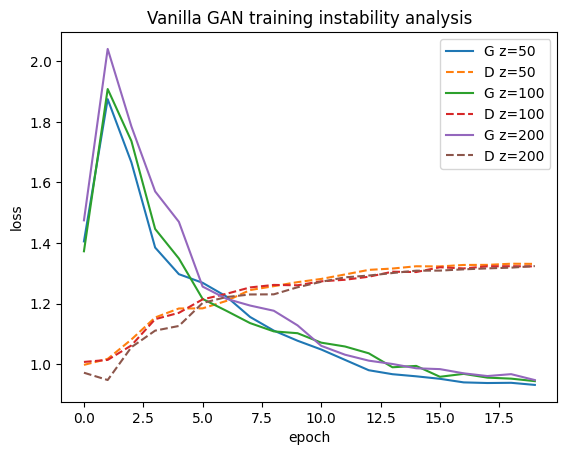

In [9]:
gan_runs = {}
for z_dim in [50, 100, 200]:
    print(f"\n--- Training Vanilla GAN with z_dim={z_dim} ---")
    start = time.time()
    G, D, hist = train_vanilla_gan(train_loader_tanh, z_dim=z_dim, epochs=cfg.epochs_full, lr=cfg.lr)
    minutes = (time.time() - start) / 60.0

    with torch.no_grad():
        z = torch.randn(500, z_dim, device=device)
        fake = G(z).cpu()
        diversity = fake.view(500, -1).std(dim=0).mean().item()

    gan_runs[z_dim] = {
        "G": G,
        "D": D,
        "hist": hist,
        "minutes": minutes,
        "diversity_proxy": diversity,
    }

    print(f"time={minutes:.2f} min | diversity_proxy={diversity:.4f}")

for z_dim, run in gan_runs.items():
    plt.plot(run['hist']['g'], label=f"G z={z_dim}")
    plt.plot(run['hist']['d'], linestyle='--', label=f"D z={z_dim}")
plt.title("Vanilla GAN training instability analysis")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.legend()
plt.show()

## Problem Statement 3: Conditional GAN (CGAN)
- Label embedding in both Generator and Discriminator
- Class-specific generation
- Label interpolation
- Mismatched-label discriminator analysis

[CGAN] epoch 01/20 | G=1.4886 D=1.1657
[CGAN] epoch 02/20 | G=1.4882 D=1.1945
[CGAN] epoch 03/20 | G=1.5250 D=1.1506
[CGAN] epoch 04/20 | G=1.4959 D=1.1786
[CGAN] epoch 05/20 | G=1.5471 D=1.1745
[CGAN] epoch 06/20 | G=1.4807 D=1.1839
[CGAN] epoch 07/20 | G=1.4198 D=1.1605
[CGAN] epoch 08/20 | G=1.3903 D=1.1533
[CGAN] epoch 09/20 | G=1.4322 D=1.1678
[CGAN] epoch 10/20 | G=1.4765 D=1.1400
[CGAN] epoch 11/20 | G=1.5431 D=1.1480
[CGAN] epoch 12/20 | G=1.4952 D=1.1223
[CGAN] epoch 13/20 | G=1.5057 D=1.1180
[CGAN] epoch 14/20 | G=1.5025 D=1.0963
[CGAN] epoch 15/20 | G=1.6201 D=1.1047
[CGAN] epoch 16/20 | G=1.6363 D=1.1151
[CGAN] epoch 17/20 | G=1.6277 D=1.0565
[CGAN] epoch 18/20 | G=1.7018 D=1.0759
[CGAN] epoch 19/20 | G=1.6180 D=1.0744
[CGAN] epoch 20/20 | G=1.5273 D=1.1010


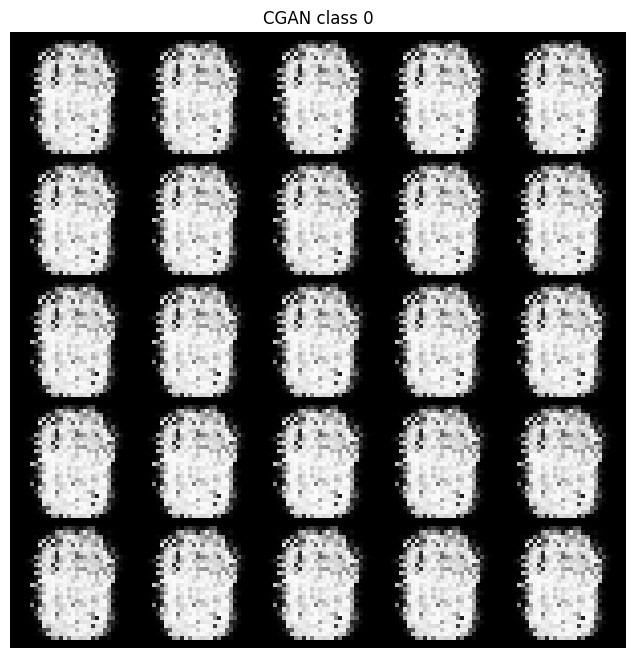

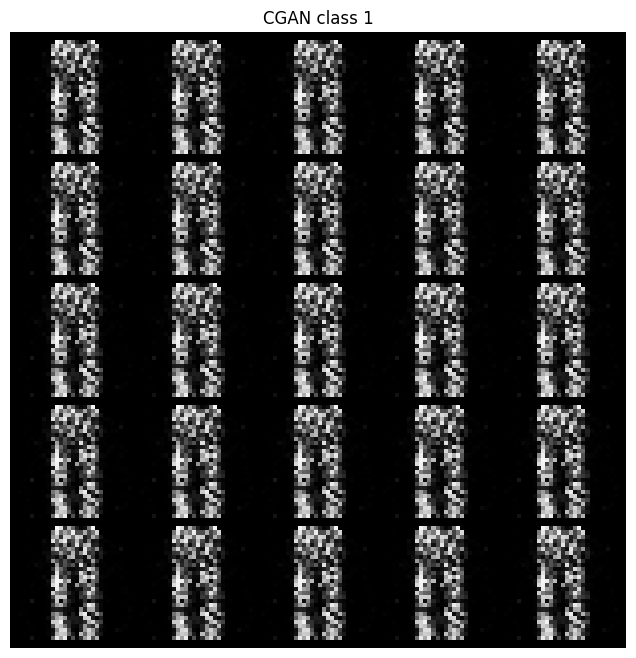

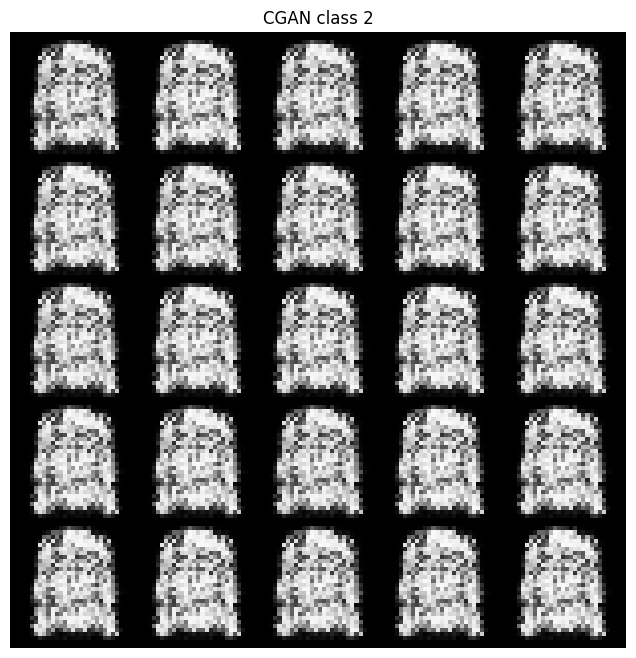

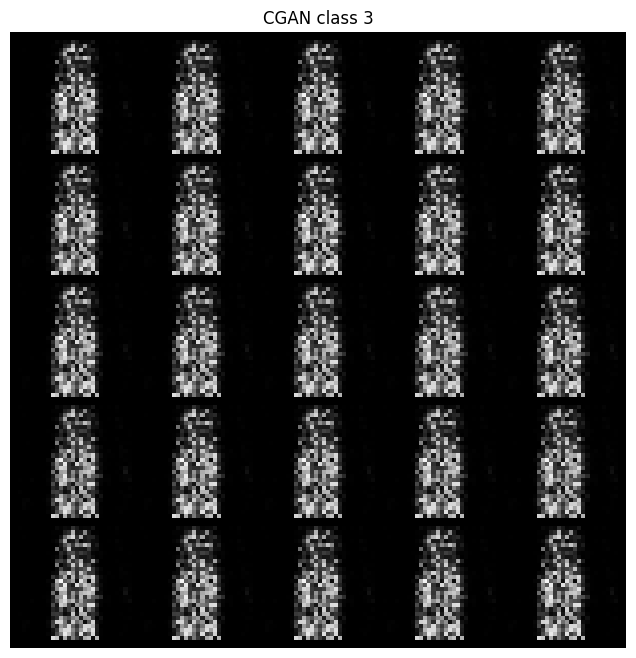

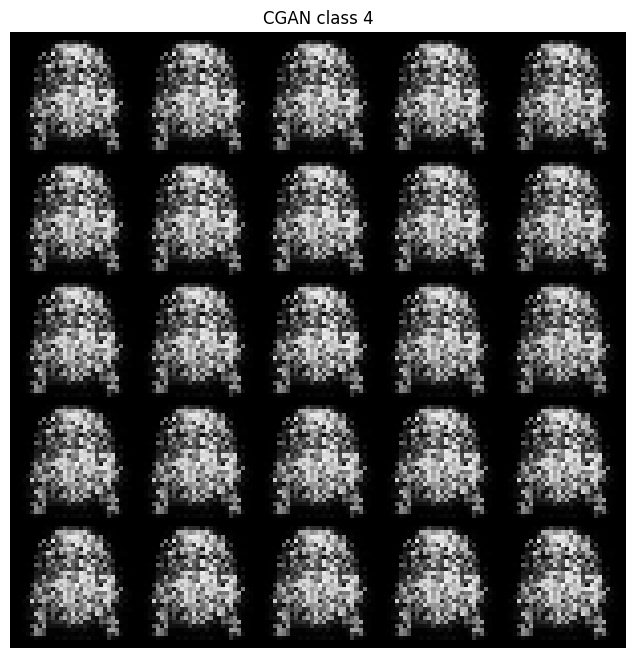

...

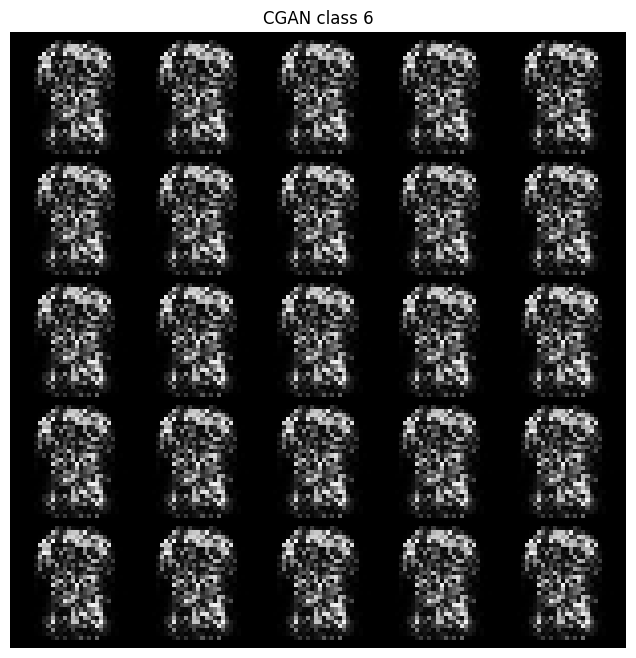

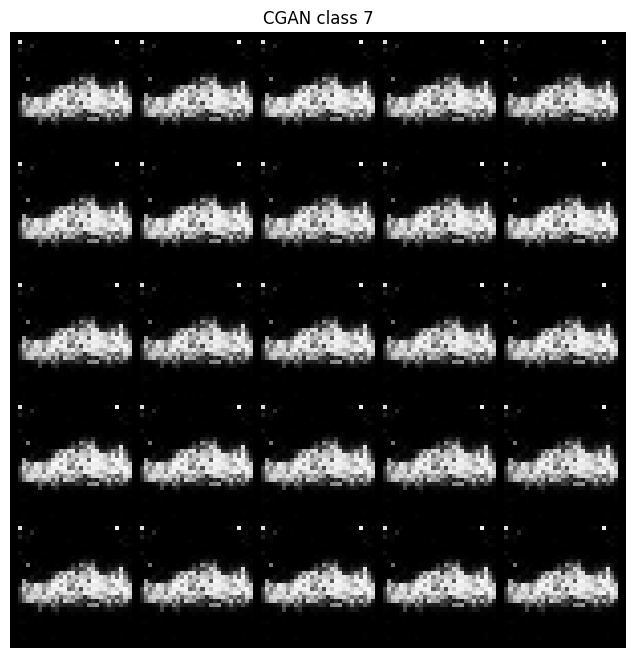

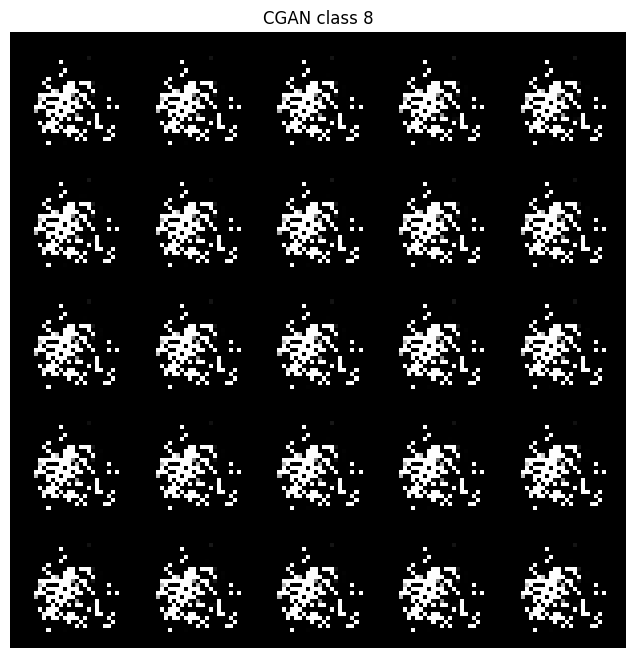

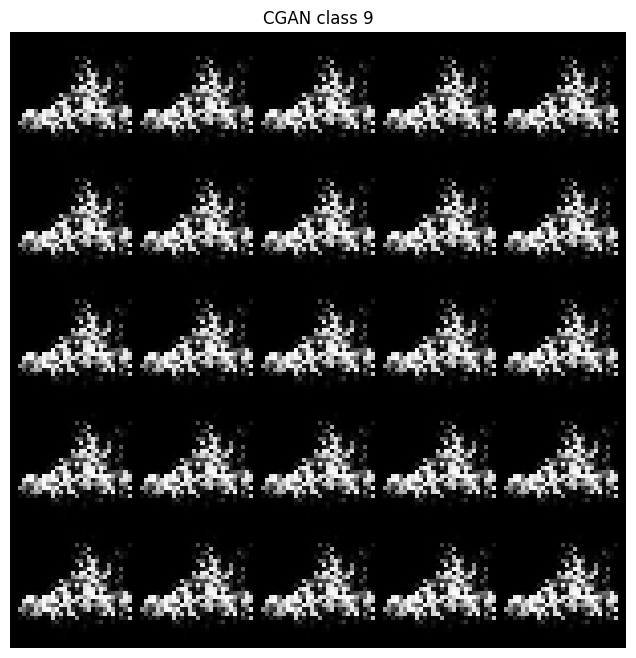

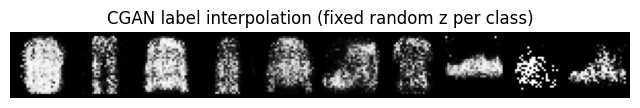

D(real, correct_label)=0.4511 | D(real, wrong_label)=0.2680


In [10]:
class CGANGenerator(nn.Module):
    def __init__(self, z_dim=100, num_classes=10, emb_dim=50):
        super().__init__()
        self.emb = nn.Embedding(num_classes, emb_dim)
        self.net = nn.Sequential(
            nn.Linear(z_dim + emb_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(inplace=True),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )

    def forward(self, z, y):
        yemb = self.emb(y)
        x = torch.cat([z, yemb], dim=1)
        return self.net(x).view(-1, 1, 28, 28)

class CGANDiscriminator(nn.Module):
    def __init__(self, num_classes=10, emb_dim=50):
        super().__init__()
        self.emb = nn.Embedding(num_classes, emb_dim)
        self.net = nn.Sequential(
            nn.Linear(784 + emb_dim, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, x, y):
        yemb = self.emb(y)
        xflat = x.view(x.size(0), -1)
        return self.net(torch.cat([xflat, yemb], dim=1))

def train_cgan(train_loader, num_classes, z_dim=100, epochs=5, lr=2e-4):
    G = CGANGenerator(z_dim=z_dim, num_classes=num_classes).to(device)
    D = CGANDiscriminator(num_classes=num_classes).to(device)
    opt_g = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_d = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    bce = nn.BCELoss()
    hist = {"g": [], "d": []}

    for epoch in range(1, epochs + 1):
        g_run, d_run = 0.0, 0.0
        for xb, yb in train_loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            bs = xb.size(0)
            real = torch.ones(bs, 1, device=device) * 0.9
            fake = torch.zeros(bs, 1, device=device)

            opt_d.zero_grad(set_to_none=True)
            z = torch.randn(bs, z_dim, device=device)
            y_fake = torch.randint(0, num_classes, (bs,), device=device)
            x_fake = G(z, y_fake).detach()
            d_loss = bce(D(xb, yb), real) + bce(D(x_fake, y_fake), fake)
            d_loss.backward()
            opt_d.step()

            opt_g.zero_grad(set_to_none=True)
            z = torch.randn(bs, z_dim, device=device)
            y_fake = torch.randint(0, num_classes, (bs,), device=device)
            x_fake = G(z, y_fake)
            g_loss = bce(D(x_fake, y_fake), torch.ones(bs, 1, device=device))
            g_loss.backward()
            opt_g.step()

            g_run += g_loss.item()
            d_run += d_loss.item()

        hist['g'].append(g_run / len(train_loader))
        hist['d'].append(d_run / len(train_loader))
        print(f"[CGAN] epoch {epoch:02d}/{epochs} | G={hist['g'][-1]:.4f} D={hist['d'][-1]:.4f}")

    return G, D, hist

cgan_G, cgan_D, cgan_hist = train_cgan(train_loader_tanh, num_classes=num_classes, z_dim=100, epochs=cfg.epochs_full, lr=cfg.lr)

# Class-specific generation (5x5 per class for first min(num_classes, 10) classes)
classes_to_show = min(num_classes, 10)
cgan_G.eval()
with torch.no_grad():
    for c in range(classes_to_show):
        y = torch.full((25,), c, device=device, dtype=torch.long)
        z = torch.randn(25, 100, device=device)
        imgs = cgan_G(z, y).cpu()
        show_images(imgs, f"CGAN class {c}", nrow=5, normalize=True)

# Label interpolation: fixed z, changing class labels
with torch.no_grad():
    z = torch.randn(classes_to_show, 100, device=device)
    y = torch.arange(classes_to_show, device=device, dtype=torch.long)
    interp = cgan_G(z, y).cpu()
show_images(interp, "CGAN label interpolation (fixed random z per class)", nrow=classes_to_show, normalize=True)

# Mismatched label attack proxy
cgan_D.eval()
xb, yb = next(iter(test_loader_tanh))
xb, yb = xb.to(device), yb.to(device)
wrong = (yb + 1) % num_classes
with torch.no_grad():
    score_correct = cgan_D(xb, yb).mean().item()
    score_wrong = cgan_D(xb, wrong).mean().item()
print(f"D(real, correct_label)={score_correct:.4f} | D(real, wrong_label)={score_wrong:.4f}")

## Problem Statement 4: DCGAN
- Convolutional Generator and Discriminator
- No pooling (strided conv only)
- BatchNorm ablation options
- Optional spectral normalization in Discriminator


--- DCGAN setting: baseline ---
[DCGAN] epoch 01/20 | G=2.5465 D=0.5670
[DCGAN] epoch 02/20 | G=1.9734 D=0.6822
[DCGAN] epoch 03/20 | G=2.0131 D=0.6884
[DCGAN] epoch 04/20 | G=2.1810 D=0.6515
[DCGAN] epoch 05/20 | G=2.2026 D=0.6412


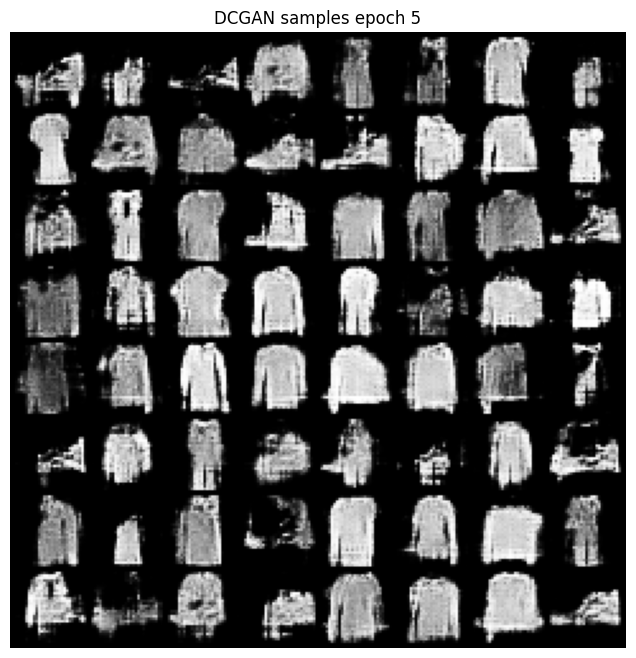

[DCGAN] epoch 06/20 | G=1.9294 D=0.7266
[DCGAN] epoch 07/20 | G=1.6861 D=0.8203
[DCGAN] epoch 08/20 | G=1.5659 D=0.8710
[DCGAN] epoch 09/20 | G=1.5333 D=0.8820
[DCGAN] epoch 10/20 | G=1.5265 D=0.8675


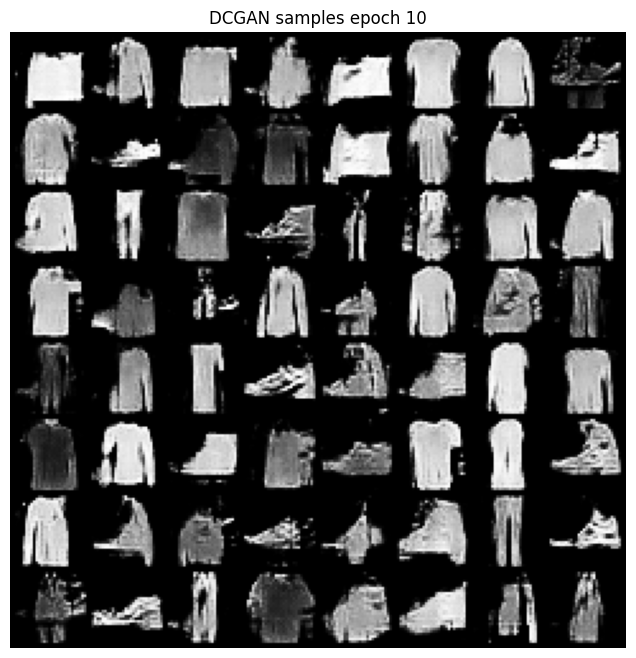

[DCGAN] epoch 11/20 | G=1.5130 D=0.9177
[DCGAN] epoch 12/20 | G=1.5111 D=0.8772
[DCGAN] epoch 13/20 | G=1.5445 D=0.8625
[DCGAN] epoch 14/20 | G=1.5736 D=0.8569
[DCGAN] epoch 15/20 | G=1.6040 D=0.8679


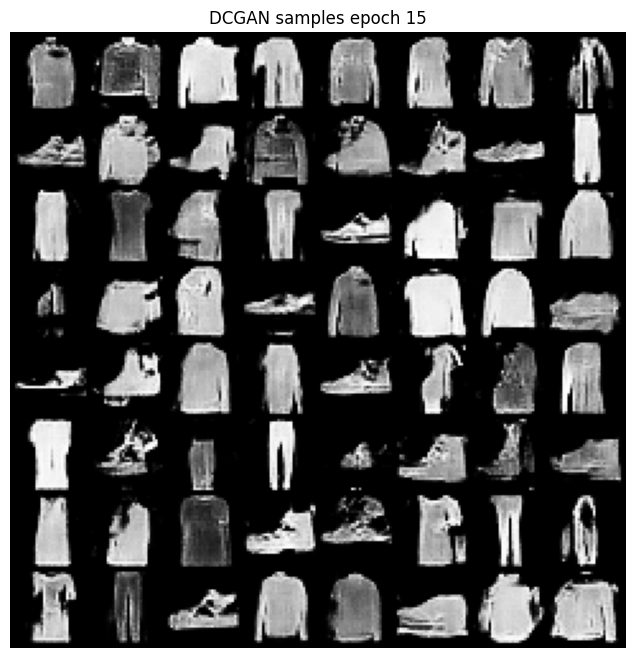

[DCGAN] epoch 16/20 | G=1.6066 D=0.8569
[DCGAN] epoch 17/20 | G=1.6254 D=0.8384
[DCGAN] epoch 18/20 | G=1.6232 D=0.8645
[DCGAN] epoch 19/20 | G=1.6388 D=0.8467
[DCGAN] epoch 20/20 | G=1.6498 D=0.8414


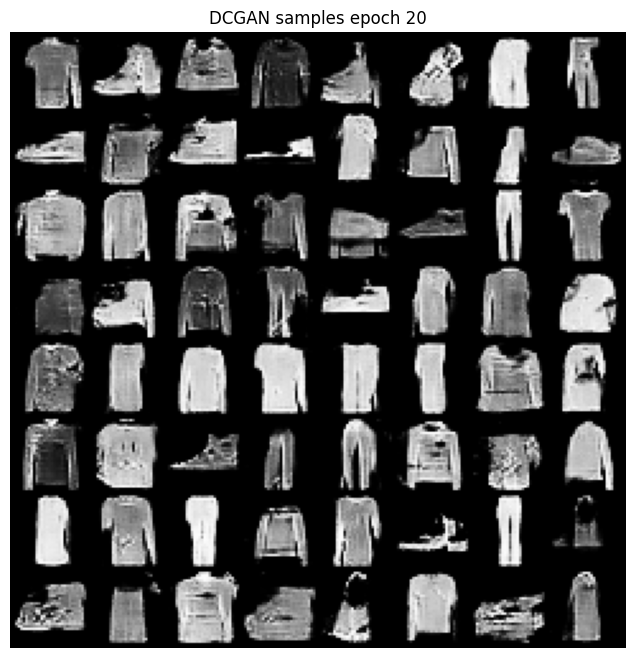


--- DCGAN setting: no_bn_g ---
[DCGAN] epoch 01/20 | G=1.5039 D=0.8614
[DCGAN] epoch 02/20 | G=1.4745 D=0.8584
[DCGAN] epoch 03/20 | G=1.4878 D=0.8830
[DCGAN] epoch 04/20 | G=1.2925 D=0.9855
[DCGAN] epoch 05/20 | G=1.2784 D=0.9905


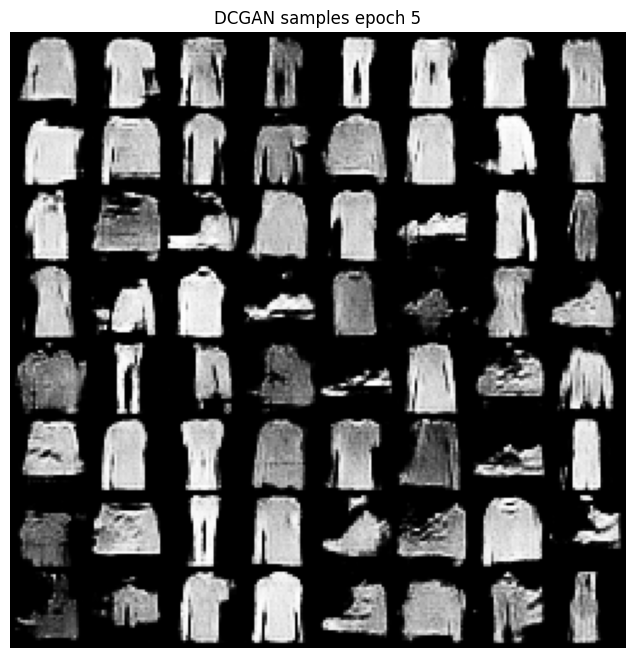

[DCGAN] epoch 06/20 | G=1.3092 D=0.9751
[DCGAN] epoch 07/20 | G=1.3559 D=0.9437
[DCGAN] epoch 08/20 | G=1.3991 D=0.9385
[DCGAN] epoch 09/20 | G=1.4390 D=0.9182
[DCGAN] epoch 10/20 | G=1.4597 D=0.9053


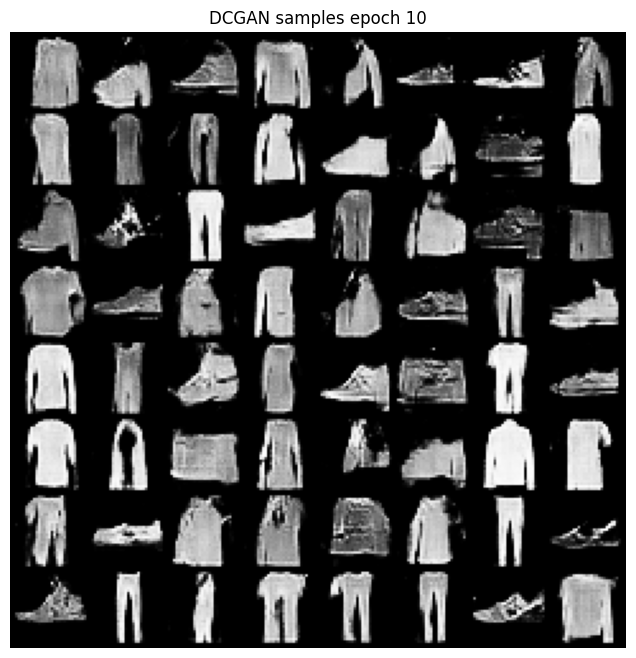

[DCGAN] epoch 11/20 | G=1.4882 D=0.9010
[DCGAN] epoch 12/20 | G=1.5159 D=0.8958
[DCGAN] epoch 13/20 | G=1.5185 D=0.8995
[DCGAN] epoch 14/20 | G=1.5451 D=0.8731
[DCGAN] epoch 15/20 | G=1.5663 D=0.8619


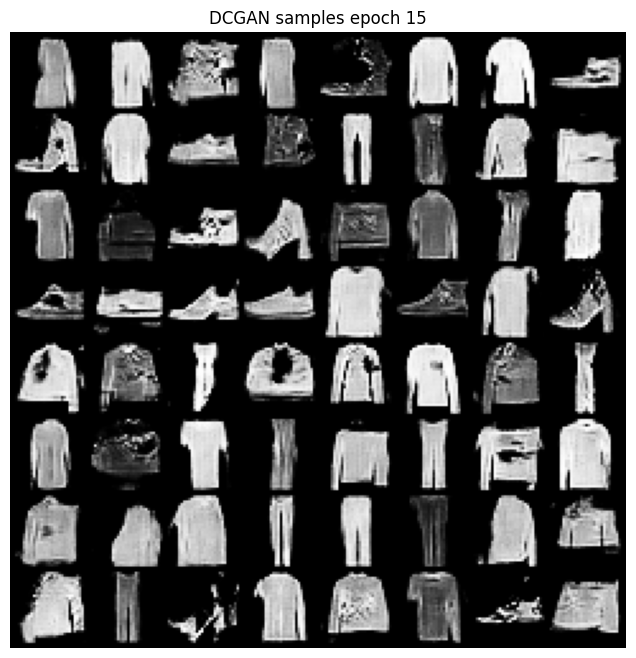

[DCGAN] epoch 16/20 | G=1.5870 D=0.8620
[DCGAN] epoch 17/20 | G=1.6031 D=0.8574
[DCGAN] epoch 18/20 | G=1.6343 D=0.8375
[DCGAN] epoch 19/20 | G=1.6508 D=0.8434
[DCGAN] epoch 20/20 | G=1.6254 D=0.8951


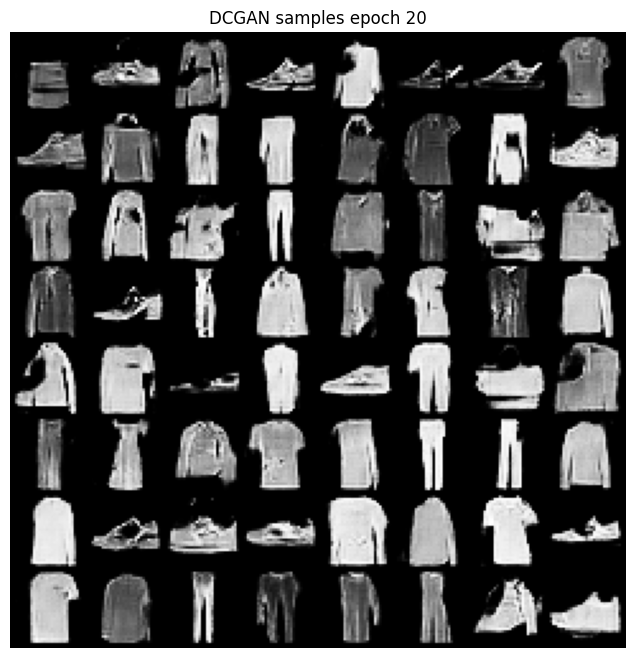


--- DCGAN setting: no_bn_d ---
[DCGAN] epoch 01/20 | G=2.5317 D=0.6061
[DCGAN] epoch 02/20 | G=1.5133 D=0.9502
[DCGAN] epoch 03/20 | G=1.1921 D=1.1130
[DCGAN] epoch 04/20 | G=1.4029 D=0.9429
[DCGAN] epoch 05/20 | G=1.5698 D=0.9192


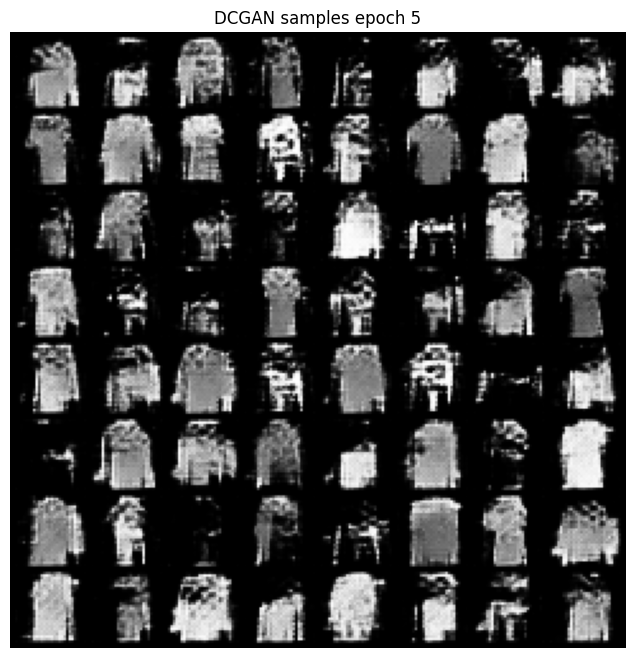

[DCGAN] epoch 06/20 | G=1.5732 D=0.9214
[DCGAN] epoch 07/20 | G=1.4510 D=0.9880
[DCGAN] epoch 08/20 | G=1.3785 D=0.9989
[DCGAN] epoch 09/20 | G=1.3571 D=0.9990
[DCGAN] epoch 10/20 | G=1.3280 D=1.0182


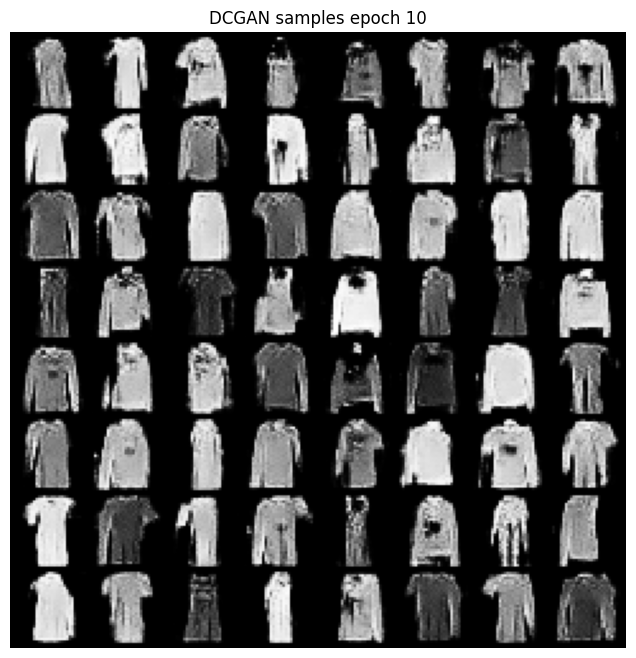

[DCGAN] epoch 11/20 | G=1.2963 D=1.0465
[DCGAN] epoch 12/20 | G=1.2737 D=1.0649
[DCGAN] epoch 13/20 | G=1.2528 D=1.0776
[DCGAN] epoch 14/20 | G=1.2300 D=1.0830
[DCGAN] epoch 15/20 | G=1.2285 D=1.0924


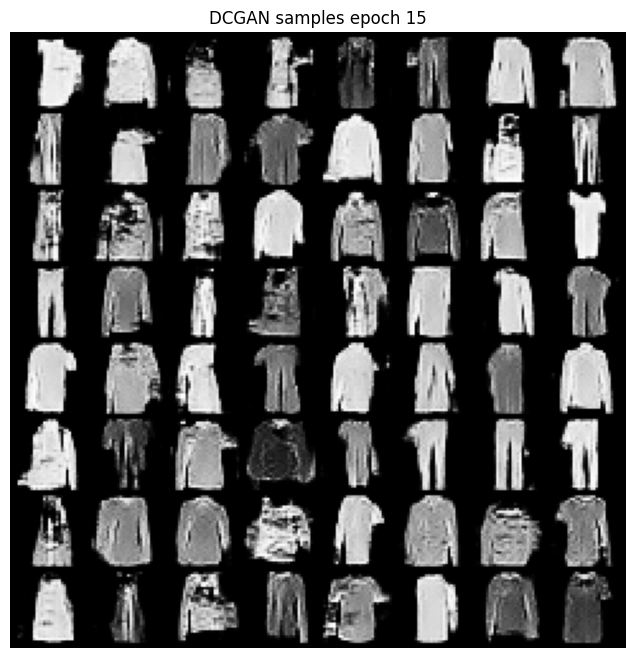

[DCGAN] epoch 16/20 | G=1.2037 D=1.0951
[DCGAN] epoch 17/20 | G=1.1934 D=1.1069
[DCGAN] epoch 18/20 | G=1.1839 D=1.1150
[DCGAN] epoch 19/20 | G=1.1742 D=1.1210
[DCGAN] epoch 20/20 | G=1.1574 D=1.1293


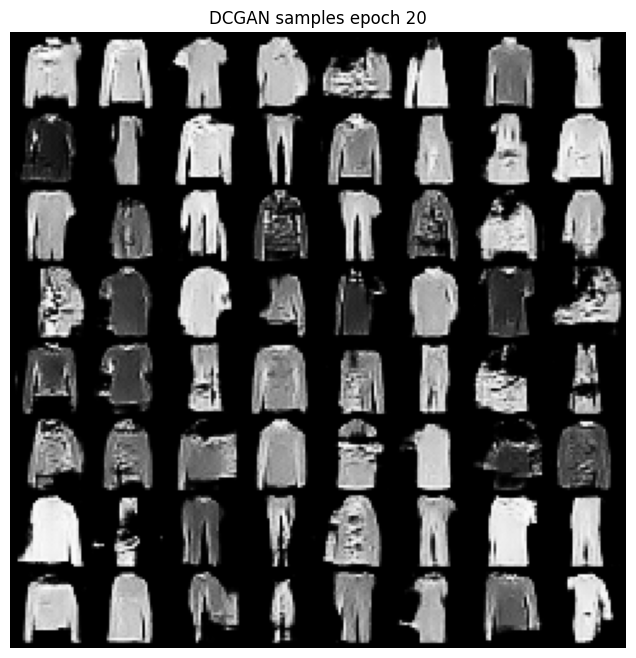


--- DCGAN setting: no_bn_both ---
[DCGAN] epoch 01/20 | G=1.5096 D=0.9152
[DCGAN] epoch 02/20 | G=1.0758 D=1.2253
[DCGAN] epoch 03/20 | G=1.0038 D=1.2036
[DCGAN] epoch 04/20 | G=1.0534 D=1.1510
[DCGAN] epoch 05/20 | G=1.1334 D=1.1127


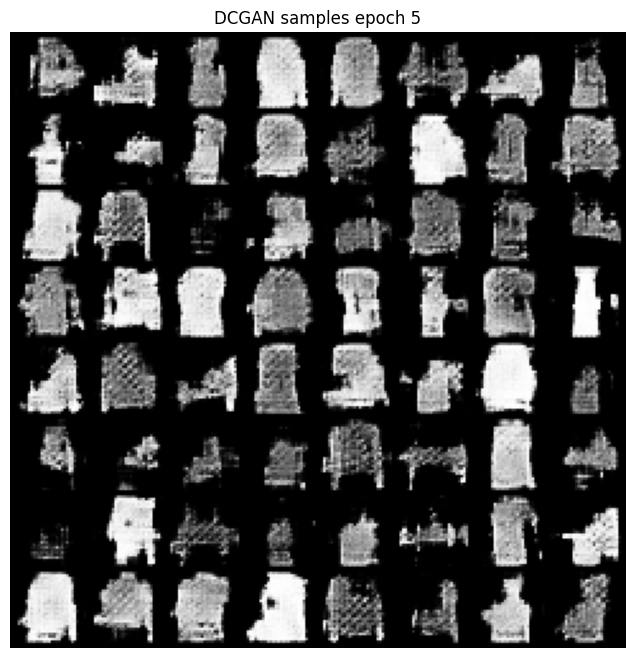

[DCGAN] epoch 06/20 | G=1.1111 D=1.1434
[DCGAN] epoch 07/20 | G=1.0486 D=1.1997
[DCGAN] epoch 08/20 | G=1.0114 D=1.2446
[DCGAN] epoch 09/20 | G=0.9674 D=1.2564
[DCGAN] epoch 10/20 | G=0.9517 D=1.2586


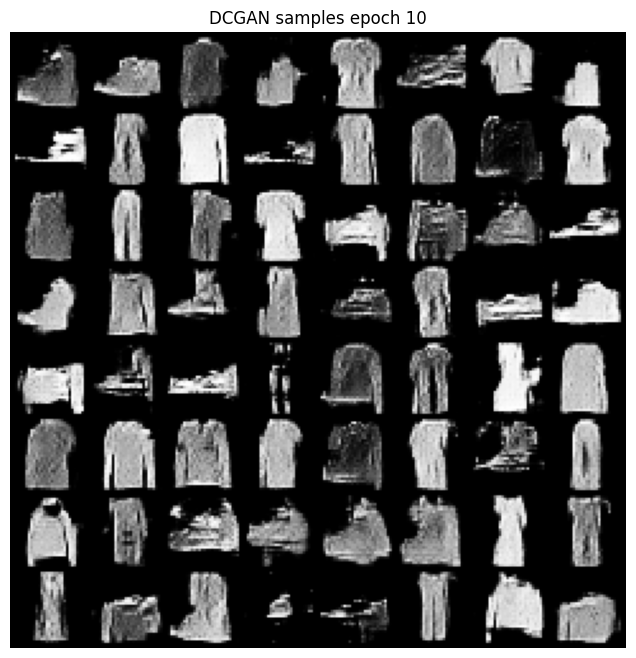

[DCGAN] epoch 11/20 | G=0.9456 D=1.2610
[DCGAN] epoch 12/20 | G=0.9430 D=1.2628
[DCGAN] epoch 13/20 | G=0.9452 D=1.2588
[DCGAN] epoch 14/20 | G=0.9462 D=1.2631
[DCGAN] epoch 15/20 | G=0.9457 D=1.2617


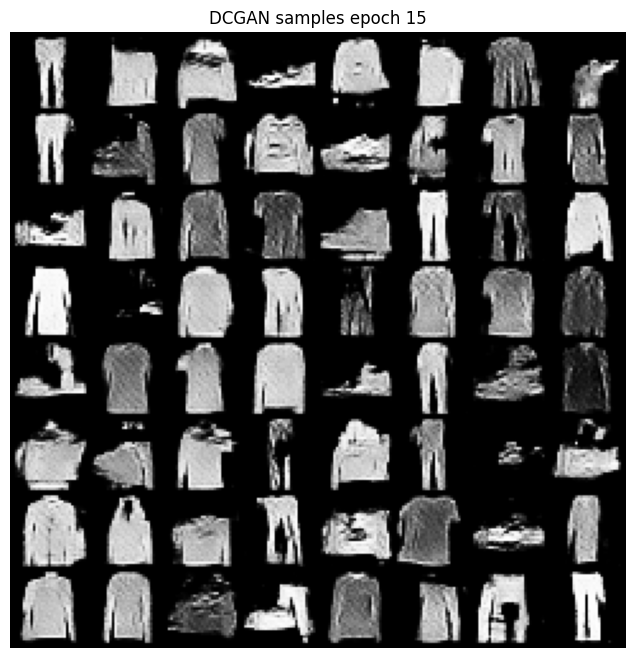

[DCGAN] epoch 16/20 | G=0.9448 D=1.2622
[DCGAN] epoch 17/20 | G=0.9434 D=1.2607
[DCGAN] epoch 18/20 | G=0.9455 D=1.2599
[DCGAN] epoch 19/20 | G=0.9457 D=1.2618
[DCGAN] epoch 20/20 | G=0.9490 D=1.2612


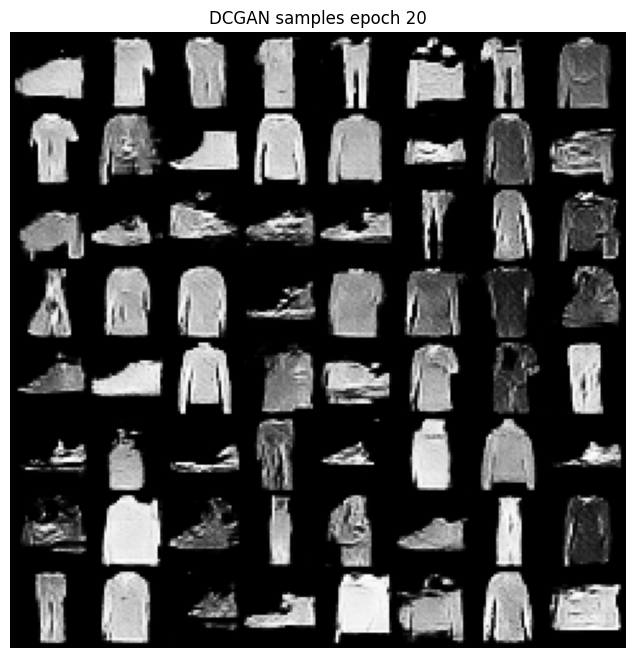


--- DCGAN setting: spectral_d ---
[DCGAN] epoch 01/20 | G=2.5764 D=0.5490
[DCGAN] epoch 02/20 | G=2.0027 D=0.6441
[DCGAN] epoch 03/20 | G=2.0533 D=0.6382
[DCGAN] epoch 04/20 | G=2.2017 D=0.6050
[DCGAN] epoch 05/20 | G=2.1101 D=0.6459


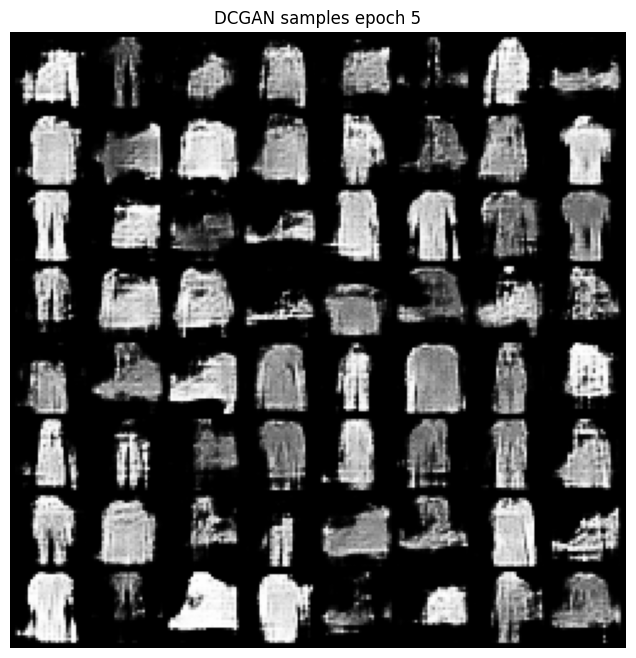

[DCGAN] epoch 06/20 | G=1.8161 D=0.7578
[DCGAN] epoch 07/20 | G=1.6578 D=0.8335
[DCGAN] epoch 08/20 | G=1.5741 D=0.8685
[DCGAN] epoch 09/20 | G=1.5342 D=0.8880
[DCGAN] epoch 10/20 | G=1.5158 D=0.8921


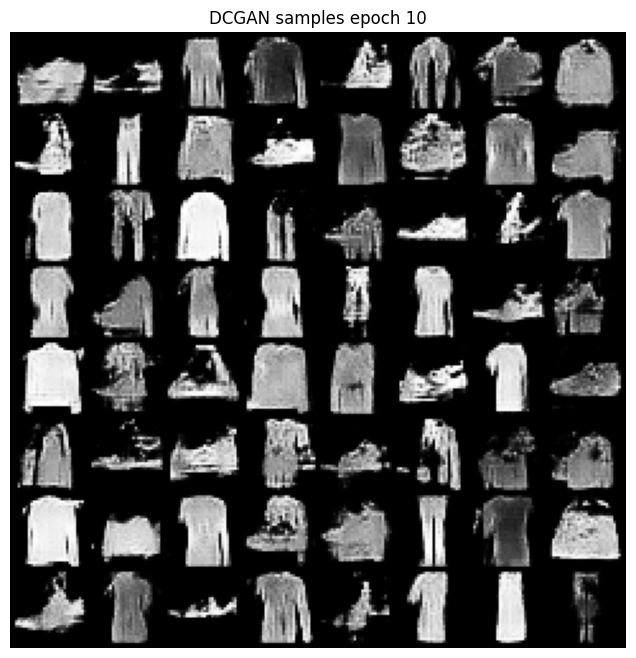

[DCGAN] epoch 11/20 | G=1.5118 D=0.9007
[DCGAN] epoch 12/20 | G=1.5022 D=0.8948
[DCGAN] epoch 13/20 | G=1.5047 D=0.9018
[DCGAN] epoch 14/20 | G=1.5228 D=0.9016
[DCGAN] epoch 15/20 | G=1.5231 D=0.8938


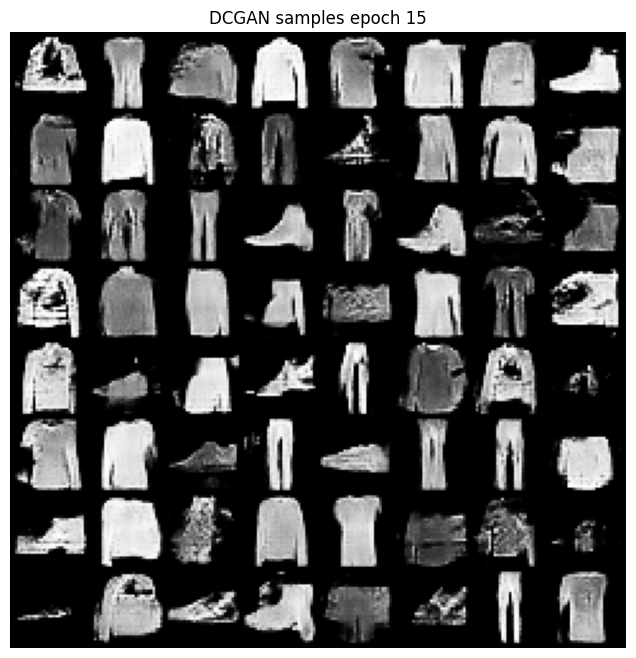

[DCGAN] epoch 16/20 | G=1.5287 D=0.9005
[DCGAN] epoch 17/20 | G=1.5357 D=0.8981
[DCGAN] epoch 18/20 | G=1.5364 D=0.8957
[DCGAN] epoch 19/20 | G=1.5393 D=0.8974
[DCGAN] epoch 20/20 | G=1.5471 D=0.8981


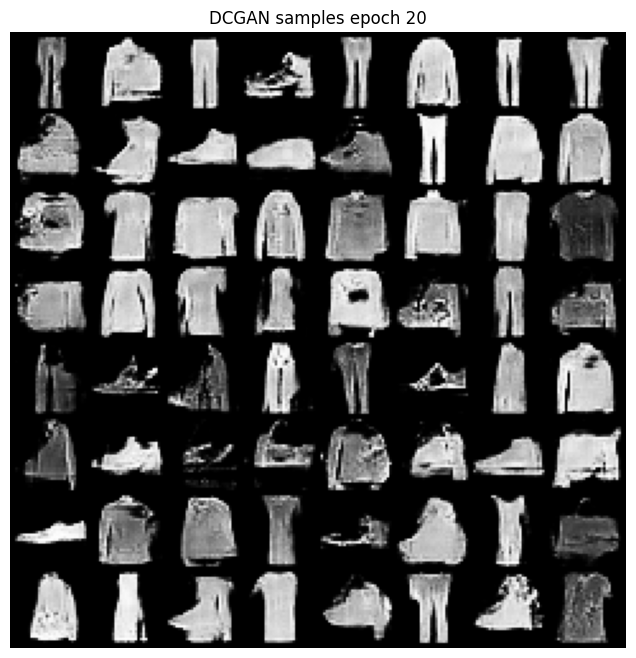

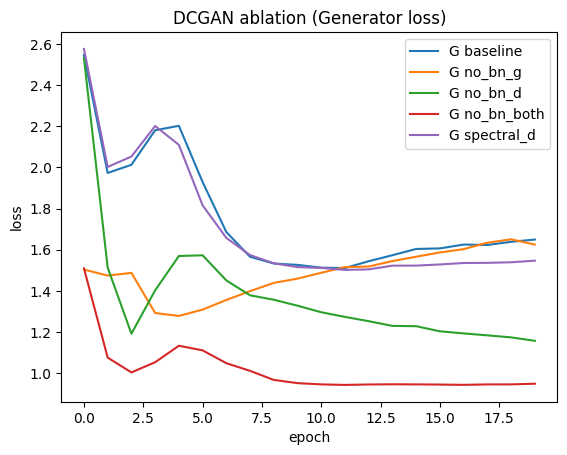

In [11]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find('BatchNorm') != -1:
        if hasattr(m, 'weight') and m.weight is not None:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, 'bias') and m.bias is not None:
            nn.init.constant_(m.bias.data, 0)

class DCGenerator(nn.Module):
    def __init__(self, z_dim=100, use_bn=True):
        super().__init__()
        self.fc = nn.Linear(z_dim, 128 * 7 * 7)
        blocks = []
        blocks += [nn.ConvTranspose2d(128, 64, 4, 2, 1)]
        if use_bn:
            blocks += [nn.BatchNorm2d(64)]
        blocks += [nn.ReLU(True)]
        blocks += [nn.ConvTranspose2d(64, 1, 4, 2, 1), nn.Tanh()]
        self.deconv = nn.Sequential(*blocks)

    def forward(self, z):
        x = self.fc(z).view(-1, 128, 7, 7)
        return self.deconv(x)

class DCDiscriminator(nn.Module):
    def __init__(self, use_bn=True, spectral_norm=False):
        super().__init__()
        c1 = nn.Conv2d(1, 64, 4, 2, 1)
        c2 = nn.Conv2d(64, 128, 4, 2, 1)
        if spectral_norm:
            c1 = nn.utils.spectral_norm(c1)
            c2 = nn.utils.spectral_norm(c2)

        layers = [c1, nn.LeakyReLU(0.2, inplace=True)]
        layers += [c2]
        if use_bn:
            layers += [nn.BatchNorm2d(128)]
        layers += [nn.LeakyReLU(0.2, inplace=True)]
        self.conv = nn.Sequential(*layers)
        self.fc = nn.Sequential(nn.Flatten(), nn.Linear(128 * 7 * 7, 1), nn.Sigmoid())

    def forward(self, x):
        h = self.conv(x)
        return self.fc(h)

def train_dcgan(train_loader, z_dim=100, epochs=5, lr=2e-4, use_bn_g=True, use_bn_d=True, spectral_norm=False):
    G = DCGenerator(z_dim=z_dim, use_bn=use_bn_g).to(device)
    D = DCDiscriminator(use_bn=use_bn_d, spectral_norm=spectral_norm).to(device)
    G.apply(weights_init)
    D.apply(weights_init)

    opt_g = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_d = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    bce = nn.BCELoss()
    hist = {"g": [], "d": []}

    for epoch in range(1, epochs + 1):
        g_run, d_run = 0.0, 0.0
        for xb, _ in train_loader:
            xb = xb.to(device, non_blocking=True)
            bs = xb.size(0)
            real = torch.ones(bs, 1, device=device) * 0.9
            fake = torch.zeros(bs, 1, device=device)

            opt_d.zero_grad(set_to_none=True)
            z = torch.randn(bs, z_dim, device=device)
            x_fake = G(z).detach()
            d_loss = bce(D(xb), real) + bce(D(x_fake), fake)
            d_loss.backward()
            opt_d.step()

            opt_g.zero_grad(set_to_none=True)
            z = torch.randn(bs, z_dim, device=device)
            x_fake = G(z)
            g_loss = bce(D(x_fake), torch.ones(bs, 1, device=device))
            g_loss.backward()
            opt_g.step()

            g_run += g_loss.item()
            d_run += d_loss.item()

        hist['g'].append(g_run / len(train_loader))
        hist['d'].append(d_run / len(train_loader))
        print(f"[DCGAN] epoch {epoch:02d}/{epochs} | G={hist['g'][-1]:.4f} D={hist['d'][-1]:.4f}")

        if epoch % 5 == 0 or epoch == epochs:
            with torch.no_grad():
                z = torch.randn(64, z_dim, device=device)
                samples = G(z).cpu()
            show_images(samples, f"DCGAN samples epoch {epoch}", nrow=8, normalize=True)

    return G, D, hist

dc_runs = {}
settings = [
    ("baseline", True, True, False),
    ("no_bn_g", False, True, False),
    ("no_bn_d", True, False, False),
    ("no_bn_both", False, False, False),
    ("spectral_d", True, True, True),
]

for name, bng, bnd, sn in settings:
    print(f"\n--- DCGAN setting: {name} ---")
    G, D, hist = train_dcgan(train_loader_tanh, z_dim=100, epochs=cfg.epochs_full, lr=cfg.lr, use_bn_g=bng, use_bn_d=bnd, spectral_norm=sn)
    dc_runs[name] = {"G": G, "D": D, "hist": hist}

for name, run in dc_runs.items():
    plt.plot(run['hist']['g'], label=f"G {name}")
plt.title("DCGAN ablation (Generator loss)")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.legend()
plt.show()

## Problem Statement 5: Comparative Study (VAE vs GAN vs CGAN vs DCGAN)
This section creates a result table. FID/IS columns are scaffolded so you can fill values after running longer training.

,Model,Dataset,Params,Inference_sec,Training_min,Recon_MSE,FID,IS
0,VAE,fashion,145105,0.000779,1.856914,245.445828,NaN,NaN
1,GAN,fashion,1511952,0.000214,2.606381,NaN,NaN,NaN
2,CGAN,fashion,1503236,0.000502,NaN,NaN,NaN,NaN
3,DCGAN,fashion,765761,0.001628,NaN,NaN,NaN,NaN


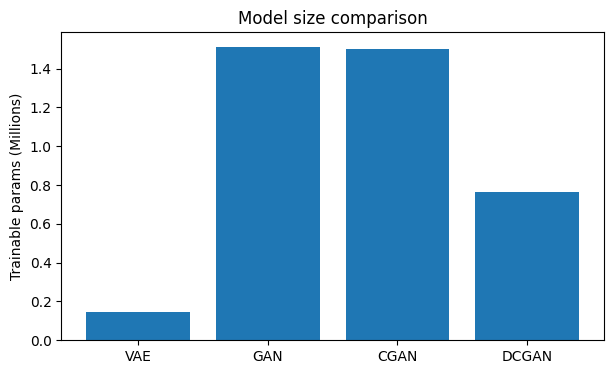

In [12]:
def benchmark_inference(model, input_tensor, runs=30):
    model.eval()
    torch.cuda.synchronize() if device.type == 'cuda' else None
    start = time.time()
    with torch.no_grad():
        for _ in range(runs):
            _ = model(input_tensor)
    torch.cuda.synchronize() if device.type == 'cuda' else None
    return (time.time() - start) / runs

results = []

# VAE
x_small, _ = next(iter(test_loader_01))
x_small = x_small[:64].to(device)
vae_inf = benchmark_inference(vae_best, x_small, runs=20)
results.append({
    "Model": "VAE",
    "Dataset": cfg.dataset_name,
    "Params": count_params(vae_best),
    "Inference_sec": vae_inf,
    "Training_min": vae_runs[best_ld]['minutes'],
    "Recon_MSE": float(vae_runs[best_ld]['final_val']),
    "FID": np.nan,
    "IS": np.nan,
})

# GAN (best diversity proxy)
best_z = max(gan_runs, key=lambda k: gan_runs[k]['diversity_proxy'])
gan_g = gan_runs[best_z]['G']
z = torch.randn(64, best_z, device=device)
gan_inf = benchmark_inference(gan_g, z, runs=20)
results.append({
    "Model": "GAN",
    "Dataset": cfg.dataset_name,
    "Params": count_params(gan_g),
    "Inference_sec": gan_inf,
    "Training_min": gan_runs[best_z]['minutes'],
    "Recon_MSE": np.nan,
    "FID": np.nan,
    "IS": np.nan,
})

# CGAN
z = torch.randn(64, 100, device=device)
y = torch.randint(0, num_classes, (64,), device=device)
cgan_G.eval()
torch.cuda.synchronize() if device.type == 'cuda' else None
start = time.time()
with torch.no_grad():
    for _ in range(20):
        _ = cgan_G(z, y)
torch.cuda.synchronize() if device.type == 'cuda' else None
cgan_inf = (time.time() - start) / 20
results.append({
    "Model": "CGAN",
    "Dataset": cfg.dataset_name,
    "Params": count_params(cgan_G),
    "Inference_sec": cgan_inf,
    "Training_min": np.nan,
    "Recon_MSE": np.nan,
    "FID": np.nan,
    "IS": np.nan,
})

# DCGAN baseline
dcg = dc_runs['baseline']['G']
z = torch.randn(64, 100, device=device)
dc_inf = benchmark_inference(dcg, z, runs=20)
results.append({
    "Model": "DCGAN",
    "Dataset": cfg.dataset_name,
    "Params": count_params(dcg),
    "Inference_sec": dc_inf,
    "Training_min": np.nan,
    "Recon_MSE": np.nan,
    "FID": np.nan,
    "IS": np.nan,
})

comp_df = pd.DataFrame(results)
display(comp_df)

plt.figure(figsize=(7, 4))
plt.bar(comp_df['Model'], comp_df['Params'] / 1e6)
plt.ylabel('Trainable params (Millions)')
plt.title('Model size comparison')
plt.show()

## Problem Statement 6: Data Augmentation using Generative Models
Train a classifier on a 10% real subset, then retrain with 50% real + 50% synthetic data.

In [13]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 7 * 7, 128), nn.ReLU(),
            nn.Linear(128, num_classes),
        )

    def forward(self, x):
        return self.classifier(self.features(x))

def train_classifier(model, train_loader, test_loader, epochs=5, lr=1e-3):
    model.to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    ce = nn.CrossEntropyLoss()

    for ep in range(1, epochs + 1):
        model.train()
        for xb, yb in train_loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            opt.zero_grad(set_to_none=True)
            loss = ce(model(xb), yb)
            loss.backward()
            opt.step()

        model.eval()
        correct, total = 0, 0
        with torch.no_grad():
            for xb, yb in test_loader:
                xb = xb.to(device, non_blocking=True)
                yb = yb.to(device, non_blocking=True)
                pred = model(xb).argmax(1)
                correct += (pred == yb).sum().item()
                total += yb.numel()
        acc = 100.0 * correct / total
        print(f"[CLS] epoch {ep:02d}/{epochs} | test_acc={acc:.2f}%")

    return acc

# Baseline: 10% real
train_ds, _ = get_dataset(cfg.dataset_name, cfg.emnist_split, train=True, tanh=False)
test_ds, _ = get_dataset(cfg.dataset_name, cfg.emnist_split, train=False, tanh=False)
n10 = int(0.1 * len(train_ds))
subset_idx = np.random.choice(len(train_ds), n10, replace=False)
train_10 = Subset(train_ds, subset_idx.tolist())
loader_10 = DataLoader(train_10, batch_size=cfg.batch_size, shuffle=True, num_workers=cfg.num_workers)
loader_test = DataLoader(test_ds, batch_size=cfg.batch_size, shuffle=False, num_workers=cfg.num_workers)

cls_base = SimpleCNN(num_classes=num_classes)
acc_base = train_classifier(cls_base, loader_10, loader_test, epochs=cfg.epochs_full, lr=1e-3)

# Synthetic from CGAN (matched size to n10 for 50:50 blend)
cgan_G.eval()
with torch.no_grad():
    ys = torch.randint(0, num_classes, (n10,), device=device)
    zs = torch.randn(n10, 100, device=device)
    x_syn = cgan_G(zs, ys).cpu()
    x_syn = (x_syn + 1.0) / 2.0
    y_syn = ys.cpu()

x_real, y_real = [], []
for xi, yi in train_10:
    x_real.append(xi)
    y_real.append(yi)
x_real = torch.stack(x_real)
y_real = torch.tensor(y_real, dtype=torch.long)

x_aug = torch.cat([x_real, x_syn], dim=0)
y_aug = torch.cat([y_real, y_syn], dim=0)
aug_ds = TensorDataset(x_aug, y_aug)
aug_loader = DataLoader(aug_ds, batch_size=cfg.batch_size, shuffle=True, num_workers=cfg.num_workers)

cls_aug = SimpleCNN(num_classes=num_classes)
acc_aug = train_classifier(cls_aug, aug_loader, loader_test, epochs=cfg.epochs_full, lr=1e-3)

print(f"Baseline 10% real acc: {acc_base:.2f}%")
print(f"Augmented (50% real + 50% synthetic) acc: {acc_aug:.2f}%")
print(f"Delta: {acc_aug - acc_base:+.2f}%")

[CLS] epoch 01/20 | test_acc=74.66%
[CLS] epoch 02/20 | test_acc=79.51%
[CLS] epoch 03/20 | test_acc=79.25%
[CLS] epoch 04/20 | test_acc=83.06%
[CLS] epoch 05/20 | test_acc=83.51%
[CLS] epoch 06/20 | test_acc=83.61%
[CLS] epoch 07/20 | test_acc=85.15%
[CLS] epoch 08/20 | test_acc=85.28%
[CLS] epoch 09/20 | test_acc=85.11%
[CLS] epoch 10/20 | test_acc=85.68%
[CLS] epoch 11/20 | test_acc=85.84%
[CLS] epoch 12/20 | test_acc=86.41%
[CLS] epoch 13/20 | test_acc=85.65%
[CLS] epoch 14/20 | test_acc=86.38%
[CLS] epoch 15/20 | test_acc=85.99%
[CLS] epoch 16/20 | test_acc=86.93%
[CLS] epoch 17/20 | test_acc=86.47%
[CLS] epoch 18/20 | test_acc=86.37%
[CLS] epoch 19/20 | test_acc=87.68%
[CLS] epoch 20/20 | test_acc=86.43%
[CLS] epoch 01/20 | test_acc=73.01%
[CLS] epoch 02/20 | test_acc=79.24%
[CLS] epoch 03/20 | test_acc=81.86%
[CLS] epoch 04/20 | test_acc=84.17%
[CLS] epoch 05/20 | test_acc=85.01%
[CLS] epoch 06/20 | test_acc=84.86%
[CLS] epoch 07/20 | test_acc=84.24%
[CLS] epoch 08/20 | test_acc

## Problem Statement 7: Loss Function and Stability Analysis
Implements a compact comparison of GAN objectives: Vanilla, Non-saturating, LSGAN, WGAN-GP (quick mode).

[vanilla] epoch 01/20 | G=1.5492 D=0.8356 sec=7.6
[vanilla] epoch 02/20 | G=0.9554 D=1.1533 sec=7.6
[vanilla] epoch 03/20 | G=1.0341 D=1.0360 sec=7.6
[vanilla] epoch 04/20 | G=1.0295 D=1.0516 sec=7.7
[vanilla] epoch 05/20 | G=0.9947 D=1.1011 sec=7.9
[vanilla] epoch 06/20 | G=0.9973 D=1.1110 sec=7.8
[vanilla] epoch 07/20 | G=0.9879 D=1.1021 sec=7.9
[vanilla] epoch 08/20 | G=0.9982 D=1.1054 sec=7.7
[vanilla] epoch 09/20 | G=0.9942 D=1.1148 sec=7.6
[vanilla] epoch 10/20 | G=0.9890 D=1.1194 sec=7.6
[vanilla] epoch 11/20 | G=0.9899 D=1.1168 sec=7.6
[vanilla] epoch 12/20 | G=0.9907 D=1.1154 sec=7.8
[vanilla] epoch 13/20 | G=0.9997 D=1.1113 sec=7.9
[vanilla] epoch 14/20 | G=1.0040 D=1.1110 sec=7.7
[vanilla] epoch 15/20 | G=1.0059 D=1.1031 sec=7.9
[vanilla] epoch 16/20 | G=1.0135 D=1.0956 sec=7.8
[vanilla] epoch 17/20 | G=1.0211 D=1.0919 sec=7.7
[vanilla] epoch 18/20 | G=1.0269 D=1.0887 sec=7.8
[vanilla] epoch 19/20 | G=1.0327 D=1.0894 sec=7.7
[vanilla] epoch 20/20 | G=1.0351 D=1.0885 sec=7.8


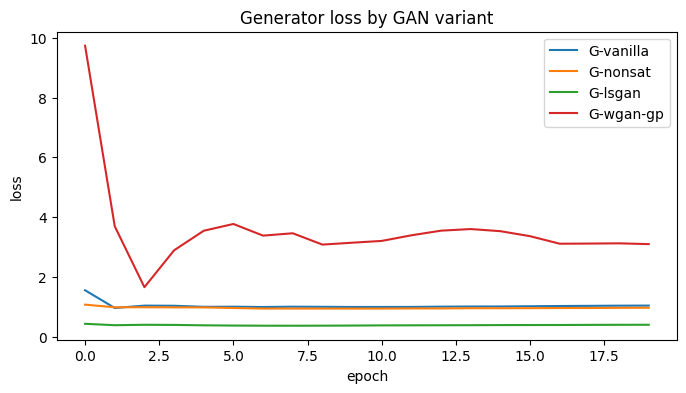

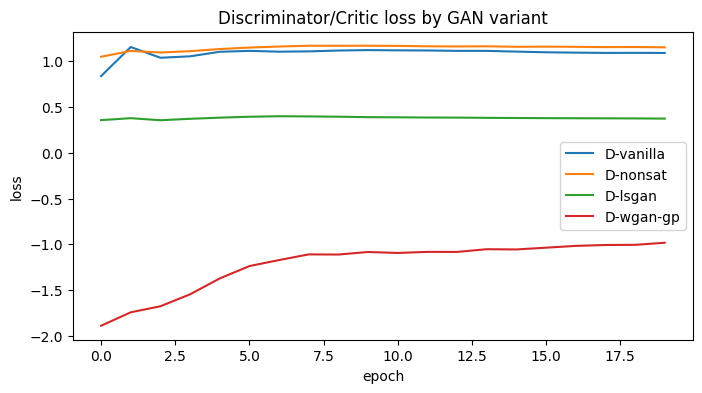

,avg_sec_per_epoch
vanilla,7.747749
nonsat,7.637337
lsgan,7.632478
wgan-gp,8.790562


In [14]:
class Critic(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1, 64, 4, 2, 1), nn.LeakyReLU(0.2, True),
            nn.Conv2d(64, 128, 4, 2, 1), nn.LeakyReLU(0.2, True),
            nn.Flatten(),
            nn.Linear(128 * 7 * 7, 1),
        )

    def forward(self, x):
        return self.net(x)

def gradient_penalty(D, real, fake):
    bs = real.size(0)
    eps = torch.rand(bs, 1, 1, 1, device=device)
    inter = eps * real + (1 - eps) * fake
    inter.requires_grad_(True)
    out = D(inter)
    grad = torch.autograd.grad(out, inter, grad_outputs=torch.ones_like(out), create_graph=True, retain_graph=True, only_inputs=True)[0]
    grad = grad.view(bs, -1)
    gp = ((grad.norm(2, dim=1) - 1) ** 2).mean()
    return gp

def run_stability_variant(train_loader, variant='vanilla', epochs=3, z_dim=100, lr=2e-4, lambda_gp=10.0):
    G = DCGenerator(z_dim=z_dim, use_bn=True).to(device)
    D = Critic().to(device)

    opt_g = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_d = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    bce = nn.BCEWithLogitsLoss()
    mse = nn.MSELoss()

    hist = {'g': [], 'd': [], 'sec_per_epoch': []}

    for ep in range(1, epochs + 1):
        t0 = time.time()
        g_run, d_run = 0.0, 0.0

        for xb, _ in train_loader:
            xb = xb.to(device, non_blocking=True)
            bs = xb.size(0)

            # D step
            opt_d.zero_grad(set_to_none=True)
            z = torch.randn(bs, z_dim, device=device)
            xf = G(z).detach()
            dr = D(xb)
            df = D(xf)

            if variant == 'vanilla':
                d_loss = bce(dr, torch.ones_like(dr)) + bce(df, torch.zeros_like(df))
            elif variant == 'nonsat':
                d_loss = bce(dr, torch.ones_like(dr)) + bce(df, torch.zeros_like(df))
            elif variant == 'lsgan':
                d_loss = mse(torch.sigmoid(dr), torch.ones_like(dr)) + mse(torch.sigmoid(df), torch.zeros_like(df))
            elif variant == 'wgan-gp':
                gp = gradient_penalty(D, xb, xf)
                d_loss = -(dr.mean() - df.mean()) + lambda_gp * gp
            else:
                raise ValueError('Unknown variant')

            d_loss.backward()
            opt_d.step()

            # G step
            opt_g.zero_grad(set_to_none=True)
            z = torch.randn(bs, z_dim, device=device)
            xf = G(z)
            df = D(xf)

            if variant in ['vanilla', 'nonsat']:
                g_loss = bce(df, torch.ones_like(df))
            elif variant == 'lsgan':
                g_loss = mse(torch.sigmoid(df), torch.ones_like(df))
            elif variant == 'wgan-gp':
                g_loss = -df.mean()

            g_loss.backward()
            opt_g.step()

            g_run += g_loss.item()
            d_run += d_loss.item()

        hist['g'].append(g_run / len(train_loader))
        hist['d'].append(d_run / len(train_loader))
        hist['sec_per_epoch'].append(time.time() - t0)
        print(f"[{variant}] epoch {ep:02d}/{epochs} | G={hist['g'][-1]:.4f} D={hist['d'][-1]:.4f} sec={hist['sec_per_epoch'][-1]:.1f}")

    return hist

variant_runs = {}
for variant in ['vanilla', 'nonsat', 'lsgan', 'wgan-gp']:
    variant_runs[variant] = run_stability_variant(train_loader_tanh, variant=variant, epochs=cfg.epochs_full, z_dim=100, lr=cfg.lr)

plt.figure(figsize=(8, 4))
for k, h in variant_runs.items():
    plt.plot(h['g'], label=f"G-{k}")
plt.title('Generator loss by GAN variant')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()

plt.figure(figsize=(8, 4))
for k, h in variant_runs.items():
    plt.plot(h['d'], label=f"D-{k}")
plt.title('Discriminator/Critic loss by GAN variant')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()

speed_df = pd.DataFrame({k: np.mean(v['sec_per_epoch']) for k, v in variant_runs.items()}, index=['avg_sec_per_epoch']).T
display(speed_df)

## Final Checklist for Report Submission
- Run the notebook once with `dataset_name='fashion'` and once with `dataset_name='emnist'`.
- Notebook is configured to run full epochs by default.
- Fill FID/IS columns after long runs (every 5 or 10 epochs).
- Save confusion matrices and misclassified examples for the classifier section.
- Add observations for stability, mode collapse, and architecture trade-offs.